# **Project Name**    - **Netflix Movies and TV Shows Clustering**



##### **Project Type**    - Unsupervised
##### **Contribution**    - Individual
##### **Name -** Abhyuday Mishra



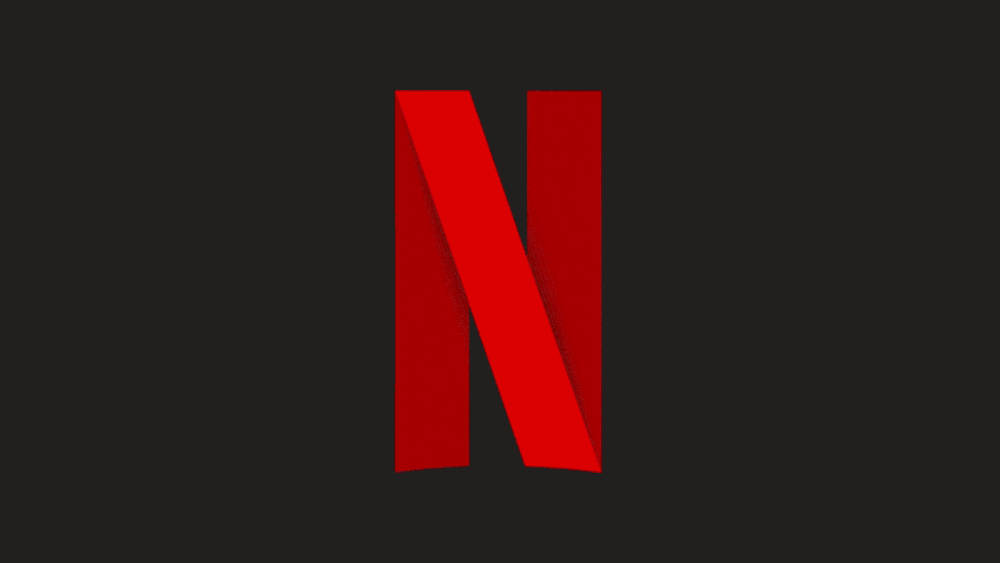

# **Project Summary -**

Netflix has been gaining popularity since its inception, and its content library has been growing at an unprecedented pace. In 2019, a dataset consisting of TV shows and movies available on Netflix was collected from Flixable, a third-party Netflix search engine. This dataset was used to explore and derive insights on the content available on Netflix and to build a content-based recommendation system.

Exploratory data analysis of the dataset revealed that movies make up 69.14% of the content on Netflix, while TV shows make up 30.86%. It was also found that the majority of content is uploaded during the months of October, November, December, and January. Drama is the most common genre on Netflix, followed by comedies and action/adventure. The USA, India, and the UK are the primary producers of content on the platform. The presence of certain words in the title of the content, such as Christmas, Love, World, Man, and Story, may indicate seasonal and thematic trends.

The dataset was preprocessed by tokenizing and vectorizing the values in the six attributes: director, cast, country, genre, rating, and description. Count vectorization resulted in the creation of 10,000 attributes, which led to high dimensionality. 

The hypothesis that the optimal number of clusters for the data is seven was tested using the elbow method and silhouette score analysis, which led to the use of the K-Means clustering algorithm. The results of clustering were further improved by using the Agglomerative clustering algorithm, which allowed for a more detailed clustering of the data and improved the accuracy of the recommendation system.

The content-based recommendation system was built using the similarity matrix obtained from the cosine similarity calculation. The system analyzes the user's watched shows to identify similar shows in the dataset and provides 10 recommendations to the user based on their viewing history with their respective similarity scores.

In order to handle the issue of high dimensionality, Principal Component Analysis (PCA) was used, which was able to capture over 85% of the variance with only 2300 components. Therefore, the number of components was restricted to 2300 to reduce the computational complexity.

The K-Means clustering algorithm was initially used to build the clusters, and through the elbow method and silhouette score analysis, it was determined that the optimal number of clusters was seven. However, it was later found that the Agglomerative clustering algorithm could provide better clustering with a higher level of accuracy. After visualizing the dendrogram, the optimal number of clusters was found to be four, which allowed for a more detailed clustering of the data and improved the accuracy of the recommendation system.

Using the similarity matrix obtained from the cosine similarity calculation, a content-based recommendation system was built. This system analyzes the user's watched shows to identify similar shows in the

Overall, the clustering and recommendation system aims to improve the user's streaming experience by suggesting relevant content based on their interests and viewing history. Future work could involve integrating the dataset with external datasets such as IMDB ratings and Rotten Tomatoes to derive more insights on the content available on Netflix.


# **GitHub Link -**

### https://github.com/abhyudaymishra/Netflix-Movies-and-TV-Shows-Clustering

# **Problem Statement**


This dataset consists of tv shows and movies available on Netflix as of 2019. The dataset is collected from Flixable which is a third-party Netflix search engine.

In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.

Integrating this dataset with other external datasets such as IMDB ratings, rotten tomatoes can also provide many interesting findings.

# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# library used for Analyzing and Visualization purpose
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Word Cloud library
from wordcloud import WordCloud, STOPWORDS

# library used for textual data prerocessing
import string
string.punctuation
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from nltk.tokenize import TweetTokenizer
from sklearn.feature_extraction.text import CountVectorizer
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
from collections import Counter
import string
import re
# library used for Clusters impelementation
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc


# library used for building recommandation system
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Warnings library. Would help to throw away warnings caused.
import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Dataset Loading

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
netflix_tv=pd.read_csv('/content/drive/MyDrive/Unsupervised ML project/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

### Dataset First View

In [ ]:
#First five rows of the dataset
netflix_tv.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,...,description,day_added,year_added,month_added,age_rating,count,country_list,tags,kmeans_cluster,hierarchical_cluster
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,...,future elite inhabit island paradise far crowd...,14,2020,8,Adults,1,[Brazil],in a futur where the elit inhabit an island pa...,6,4
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,...,"devastating earthquake hits mexico city, trapp...",23,2016,12,Adults,1,[Mexico],after a devast earthquak hit mexico citi trap ...,5,6
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,...,"army recruit found dead, fellow soldiers force...",20,2018,12,Adults,1,[Singapore],when an armi recruit is found dead hi fellow s...,0,0
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,...,"postapocalyptic world, rag-doll robots hide fe...",16,2017,11,Teens,1,[United States],in a postapocalypt world ragdol robot hide in ...,1,6
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,...,brilliant group students become card-counting ...,1,2020,1,Teens,1,[United States],a brilliant group of student becom cardcount e...,5,6


In [ ]:
#Last five rows of the dataset
netflix_tv.tail()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,...,description,day_added,year_added,month_added,age_rating,count,country_list,tags,kmeans_cluster,hierarchical_cluster
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...",2020-10-19,2005,TV-MA,99 min,...,"lebanon's civil war deprives zozo family, he's...",19,2020,10,Adults,1,"[Sweden, Czech Republic, United Kingdom, Denma...",when lebanon civil war depriv zozo of hi famil...,2,3
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,2019-03-02,2015,TV-14,111 min,...,scrappy poor boy worms way tycoon's dysfunctio...,2,2019,3,Young Adults,1,[India],a scrappi but poor boy worm hi way into a tyco...,2,3
7784,s7785,Movie,Zulu Man in Japan,,Nasty C,,2020-09-25,2019,TV-MA,44 min,...,"documentary, south african rapper nasty c hits...",25,2020,9,Adults,1,[ ],in thi documentari south african rapper nasti ...,0,0
7785,s7786,TV Show,Zumbo's Just Desserts,,"Adriano Zumbo, Rachel Khoo",Australia,2020-10-31,2019,TV-PG,1 Season,...,dessert wizard adriano zumbo looks next “willy...,31,2020,10,Older Kids,1,[Australia],dessert wizard adriano zumbo look for the next...,3,1
7786,s7787,Movie,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Sam Dunn,,"United Kingdom, Canada, United States",2020-03-01,2019,TV-MA,90 min,...,documentary delves mystique behind blues-rock ...,1,2020,3,Adults,1,"[United Kingdom, Canada, United States]",thi documentari delv into the mystiqu behind t...,3,2


### Dataset Rows & Columns count

In [ ]:
netflix_tv.shape

(7787, 12)

### Dataset Information

In [ ]:
netflix_tv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [ ]:
netflix_tv.duplicated().value_counts()

False    7787
dtype: int64

#### Missing Values/Null Values

In [ ]:
netflix_tv.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

In [ ]:
#total null values
netflix_tv .isnull().sum().sum()

3631

In [ ]:
# Checking for null values in the dataset
for col in netflix_tv.columns:
  null_rate = netflix_tv[col].isnull().sum() / len(netflix_tv) * 100
  if null_rate > 0:
    print(f'Percentage of null values in {col} : {null_rate}%')

In [ ]:
# replacing the null values with appropriate measures
netflix_tv[['director','cast','country']] = netflix_tv[['director','cast','country']].fillna(' ')
netflix_tv['rating'] = netflix_tv['rating'].fillna(netflix_tv['rating'].mode()[0])
netflix_tv.dropna(axis=0, inplace = True)

In [ ]:
#Checking total null values
netflix_tv .isnull().sum().sum()

0

## ***2. Understanding Your Variables***

In [ ]:
netflix_tv.columns


Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description',
       'day_added', 'year_added', 'month_added', 'age_rating', 'count',
       'country_list', 'tags', 'kmeans_cluster', 'hierarchical_cluster'],
      dtype='object')

In [ ]:
netflix_tv.describe()

,release_year,day_added,year_added,month_added,count,kmeans_cluster,hierarchical_cluster
count,7777.000000,7777.000000,7777.000000,7777.000000,7777.0,7777.00000,7777.000000
mean,2013.935965,12.377781,2018.493378,6.783850,1.0,3.31066,3.187604
std,8.760694,9.956787,1.388144,3.591608,0.0,2.13803,2.370604
min,1925.000000,1.000000,2008.000000,1.000000,1.0,0.00000,0.000000
25%,2013.000000,1.000000,2018.000000,4.000000,1.0,1.00000,1.000000
50%,2017.000000,12.000000,2019.000000,7.000000,1.0,3.00000,3.000000
75%,2018.000000,20.000000,2020.000000,10.000000,1.0,5.00000,6.000000
max,2021.000000,31.000000,2021.000000,12.000000,1.0,6.00000,6.000000


### Variables Description 

*There are 7787 sets of data with 12 pieces of information in each set. Some of the data in the columns for director, cast, country, date added, and rating are missing, but we will only remove the null values in date added and rating since there are only a few of them. The dataset does not contain any duplicated information.*

### Check Unique Values for each variable.

In [ ]:
#Checking unique values for each Variable
for i in netflix_tv.columns.tolist():
  if isinstance(netflix_tv[i][0], list):
    continue
  print("No. of unique values in ",i,"is",netflix_tv[i].nunique(),".")


No. of unique values in  show_id is 7777 .
No. of unique values in  type is 2 .
No. of unique values in  title is 7777 .
No. of unique values in  director is 4050 .
No. of unique values in  cast is 6822 .
No. of unique values in  country is 682 .
No. of unique values in  date_added is 1512 .
No. of unique values in  release_year is 73 .
No. of unique values in  rating is 14 .
No. of unique values in  duration is 216 .
No. of unique values in  listed_in is 491 .
No. of unique values in  description is 7759 .
No. of unique values in  day_added is 31 .
No. of unique values in  year_added is 14 .
No. of unique values in  month_added is 12 .
No. of unique values in  age_rating is 5 .
No. of unique values in  count is 1 .
No. of unique values in  tags is 7773 .
No. of unique values in  kmeans_cluster is 7 .
No. of unique values in  hierarchical_cluster is 7 .


In [ ]:
# Create new features to store date, day, month and year seperately.
netflix_tv["date_added"] = pd.to_datetime(netflix_tv['date_added'])  # First convert date_added to date time format.
netflix_tv['day_added'] = netflix_tv['date_added'].dt.day            # Compute day.
netflix_tv['year_added'] = netflix_tv['date_added'].dt.year          # Compute year.
netflix_tv['month_added'] = netflix_tv['date_added'].dt.month        # Compute month.

In [ ]:
# Checking country in which a movie was produced
netflix_tv.country.value_counts()

United States                                                   2549
India                                                            923
                                                                 506
United Kingdom                                                   396
Japan                                                            225
                                                                ... 
Russia, United States, China                                       1
Italy, Switzerland, France, Germany                                1
United States, United Kingdom, Canada                              1
United States, United Kingdom, Japan                               1
Sweden, Czech Republic, United Kingdom, Denmark, Netherlands       1
Name: country, Length: 682, dtype: int64

## ***3. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

### **Chart-1 | Months in which TV and movie shows were added**

In [ ]:
# Creating a dataframe to store manth values and counts.
months_df = pd.DataFrame(netflix_tv.month_added.value_counts())
months_df.reset_index(inplace=True)
months_df.rename(columns={'index':'month', 'month_added':'count'}, inplace=True)

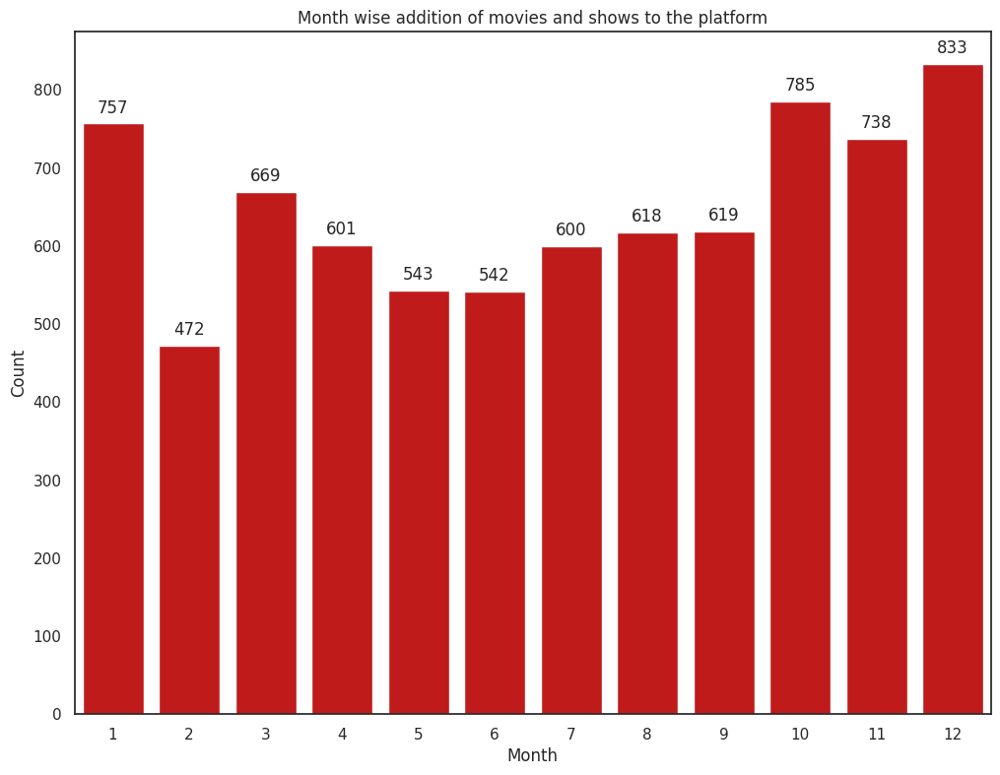

In [ ]:
# Creating a bar plot with Seaborn for visulization
plt.figure(figsize=(12, 9))
ax = sns.barplot(data=months_df, x="month", y="count", color="#db0000")

# Setting the title and labels
plt.title("Month wise addition of movies and shows to the platform")
plt.xlabel("Month")
plt.ylabel("Count")

# Adding labels to the bars
for p in ax.containers:
    ax.bar_label(p, label_type="edge", fontsize=12, padding=5)
plt.show()


##### **1. Why did you pick the specific char**t?

*Seaborn's barplot helps us in  plotting categorical data, particularly when comparing multiple categories*

##### **2. What is/are the insight(s) found from the chart?**

* *The majority of the content is uploaded at the end or beginning of the year.*
* *Many shows and movies are uploaded to the platform during the months of October, November, December, and January.*
* *It could be because of the winter, when people tend to stay at home and watch shows and movies in their spare time.*

##### **3. Will the gained insights help creating a positive business impact?**
**Are there any insights that lead to negative growth? Justify with specific reason.**

*Based on the observation that the majority of content is uploaded at the end or beginning of the year, businesses could strategically plan their content releases to coincide with these peak periods of viewer activity. Additionally, businesses could focus their marketing efforts during these months to increase awareness and engagement with their content, potentially resulting in higher viewership and revenue.*

### **Chart -2 | Percentage of movies and TVshows in the dataset**

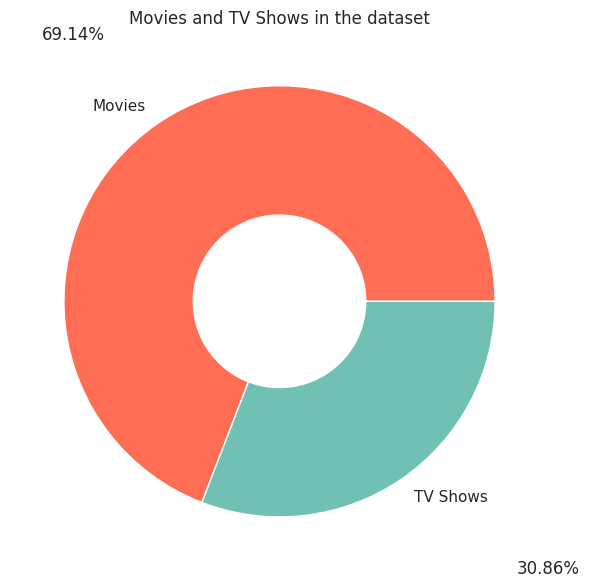

In [ ]:
# Defining labels ,size and color in the dataset
labels = ["Movies", "TV Shows"]
sizes = [netflix_tv.type.value_counts()[0], netflix_tv.type.value_counts()[1]]
colors = ["#ff6e54", "#70c1b3"]

# code to create the outer pie chart
fig, ax = plt.subplots(figsize=(7, 7))
ax.pie(sizes, labels=labels, colors=["white"], wedgeprops=dict(width=0.3, edgecolor="w"))

#  code to create the inner pie chart
wedges, _ = ax.pie(sizes, colors=colors, wedgeprops=dict(width=0.6, edgecolor="w"))

# Pecetage values addtion in the chart
percents = ["{:.2%}".format(sizes[i] / sum(sizes)) for i in range(len(sizes))]
kw = dict(arrowprops=dict(arrowstyle="-"), va="center")
for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1) / 2.0 + p.theta1
    y = (p.r + 0.25) * np.sin(np.deg2rad(ang))
    x = (p.r + 0.25) * np.cos(np.deg2rad(ang))
    ax.annotate(percents[i], xy=(x, y), xytext=(1.1 * np.sign(x), 1.2 * y), **kw)

#setting the title and showing the chart
ax.set_title("Movies and TV Shows in the dataset")
plt.show()




##### **1. Why did you pick the specific chart?**

*A Donut chart combination of two pie charts, also known as a circle chart, is a method of summarising a set of nominal data or displaying the various values of a given variable.*

##### **2. What is/are the insight(s) found from the chart?**

*This plot shows the distribution of content types in the dataset, with 69.14% of the content being movies and 30.86% being TV shows. This information can be useful for understanding the overall content offering of Netflix and could potentially inform decisions related to content acquisition and production. Additionally, this information may be of interest to users who are looking to explore the range of content available on the platform.*

##### **3. Will the gained insights help creating a positive business impact?**
**Are there any insights that lead to negative growth? Justify with specific reason.**

*Netflix has a majority of its content library dedicated to movies, with 69.14% of the dataset consisting of movies. This suggests that Netflix has been focusing more on acquiring movie content for its platform.*

*The remaining 30.86% of the dataset consists of TV shows, which is still a significant portion of the content library. This indicates that TV shows are also an important component of Netflix's content strategy. *

### **Chart -3 | Content Over the years**

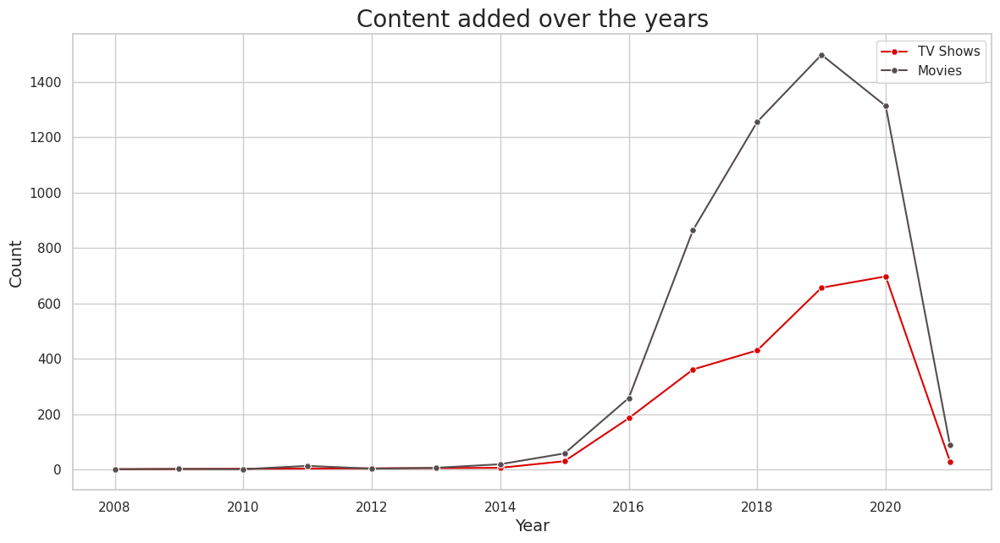

In [ ]:
#creating dataframes named as TVshoes and movies
tv_show = netflix_tv[netflix_tv["type"] == "TV Show"]
movie = netflix_tv[netflix_tv["type"] == "Movie"]
#selecting the year added column
col = "year_added"
content_1 = tv_show[col].value_counts().reset_index()
content_1 = content_1.rename(columns={col: "count", "index": col})
content_1 = content_1.sort_values(col)
content_2 = movie[col].value_counts().reset_index()
content_2 = content_2.rename(columns={col: "count", "index": col})
content_2 = content_2.sort_values(col)

#plotting the line chart to visulize the data 
plt.figure(figsize=(14, 7))
sns.set_style('whitegrid')
sns.lineplot(x=content_1[col], y=content_1["count"], label="TV Shows", color="#db0000",marker="H")
sns.lineplot(x=content_2[col], y=content_2["count"], label="Movies", color="#564d4d",marker='H')

#plotting the size and labels
plt.title("Content added over the years",size=20)
plt.xlabel("Year",size=14)
plt.ylabel("Count",size=14)
plt.legend()
plt.show()


**1. Why did you pick the specific chart?**

*The line chart from seaborn  is used to visualize trends over time. It can help to see how a variable changes over a specific period. Line charts can be used to plot various variables, and with the help of different visualizations like colors, markers, and labels, it can be made more informative and easy to understand.*

**2. What is/are the insight(s) found from the chart?**

*The plot demonstrates that the number of movies added to Netflix is increasing at a faster rate compared to TV shows. Starting from 2015, there is a clear upward trend in the addition of both movies and TV shows to the platform. The years 2019 and 2020 witnessed the highest number of content additions. However, in 2021, there seems to be a decline in the number of movies and TV shows added to the platform. This could be attributed to the limited data available for that year.*

**3.Will the gained insights help creating a positive business impact?** 
**Are there any insights that lead to negative growth? Justify with specific reason.**

*The number of movies on Netflix has grown faster than TV shows, and 2019 and 2020 saw the highest number of additions. However, data from 2021 is limited, so it's unclear if the trend will continue.*

### **Chart -4 | Which days have more content added to Netflix platform.**

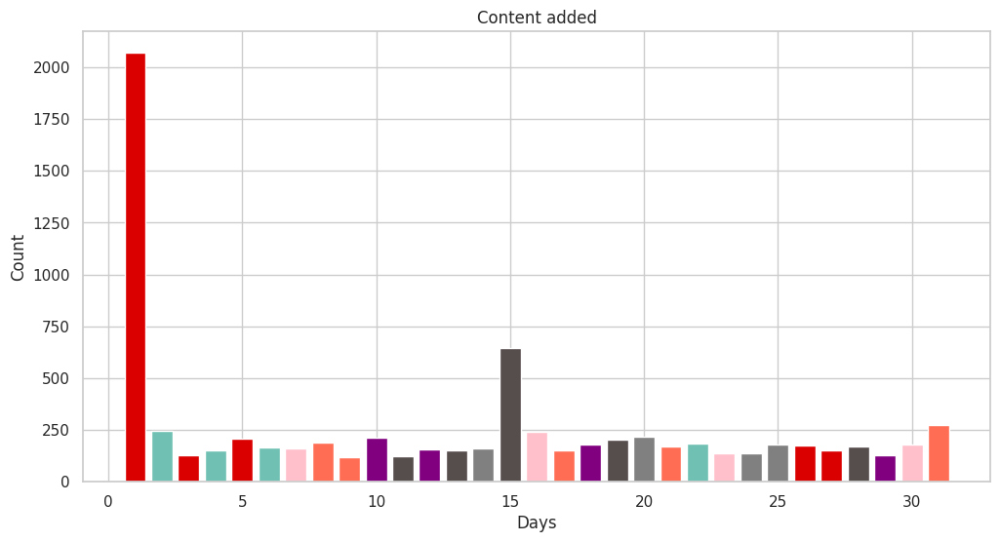

In [ ]:
#Creating a dataframet to store the dataa
days_df = pd.DataFrame(netflix_tv.day_added.value_counts())
days_df.reset_index(inplace=True)
days_df.rename(columns={'index':'day', 'day_added':'count'}, inplace=True)
#plotting the barplot
plt.figure(figsize=(12, 6))
plt.bar(days_df['day'], days_df['count'], color=['#db0000', '#564d4d', '#ff6e54', '#70c1b3', '#ffc0cb', '#808080', '#800080'])
plt.title('Content added')
plt.xlabel('Days')
plt.ylabel('Count')
plt.show()


##### **1. Why did you pick the specific chart?**

*Bar plots are used for comparing and displaying data across different categories. It is particularly useful when working with categorical data, such as counts or frequencies of different categories. Bar plots allow us to see the relative size of each category and compare them easily.*

##### **2. What is/are the insight(s) found from the chart?**

*The analysis indicates that Netflix tends to upload most of its content at the start, middle, or end of a month. Therefore, the 1st, 15th, and 31st days of a month are more significant for the addition of new TV shows and movies on the platform.*

##### **3. Will the gained insights help creating a positive business impact?** 
**Are there any insights that lead to negative growth? Justify with specific reason.**

*This insight could be useful for content strategists at Netflix to plan their content release schedule to maximize viewership and engagement on prominent days.*

### **Chart -5 | Amount of content produced by different countries.**

In [ ]:
# Creating a dict to store counts of each country appearing in our dataset.
countries = ", ".join(netflix_tv['country'].dropna()).split(", ")
countries_dict = dict(Counter(countries))
countries_dict = dict((key.lower(), value) for key, value in countries_dict.items())
     

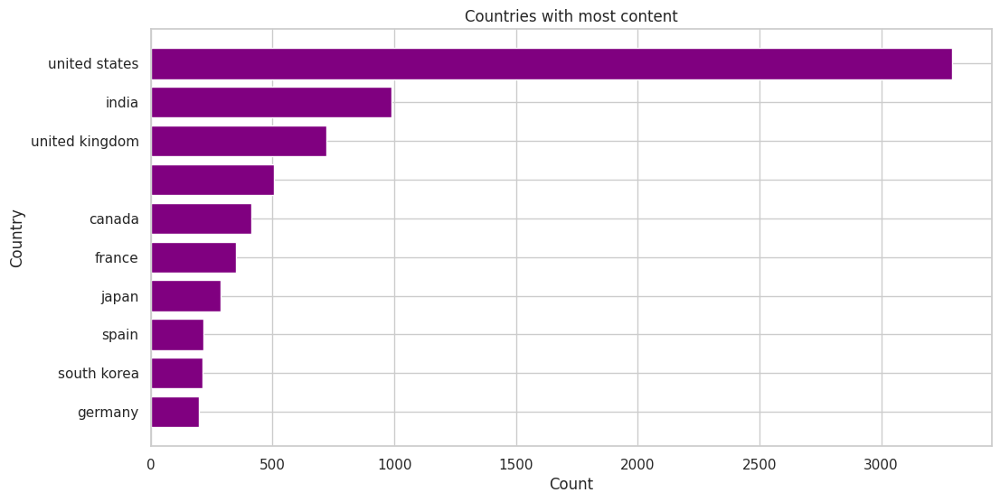

In [ ]:
# Finding the top ten countries that produce most of the content
top_ten = Counter(countries_dict).most_common(10)

# Reversing the order of the lists so that the bars are sorted from highest to lowest
countries = [item[0] for item in top_ten][::-1]
counts = [item[1] for item in top_ten][::-1]

# Creating a horizontal bar chart
plt.figure(figsize=(12, 6))
plt.barh(countries, counts, color='purple' )
plt.title('Countries with most content')
plt.xlabel('Count')
plt.ylabel('Country')
plt.show()


##### **1. Why did you pick the specific chart?**

*Bar plots are used for comparing and displaying data across different categories.It is particularly useful when working with categorical data, such as counts or frequencies of different categories. Bar plots allow us to see the relative size of each category and compare them easily.*

##### **2. What is/are the insight(s) found from the chart?**

*Most of the content on the platform is produced by the top ten countries, with the USA, India, and UK being the highest contributors, creating more than 50% of the TV shows and movies.*

##### **3. Will the gained insights help creating a positive business impact?**
**Are there any insights that lead to negative growth? Justify with specific reason.**

*The insight that the majority of content on the platform is produced by a few countries, particularly the US, India, and the UK, can have significant business implications for Netflix. It could influence their content italicized text acquisition strategy, investment decisions, and marketing campaigns in these countries to attract and retain more subscribers.*


### **Chart -6 | Distribution of Ratings**

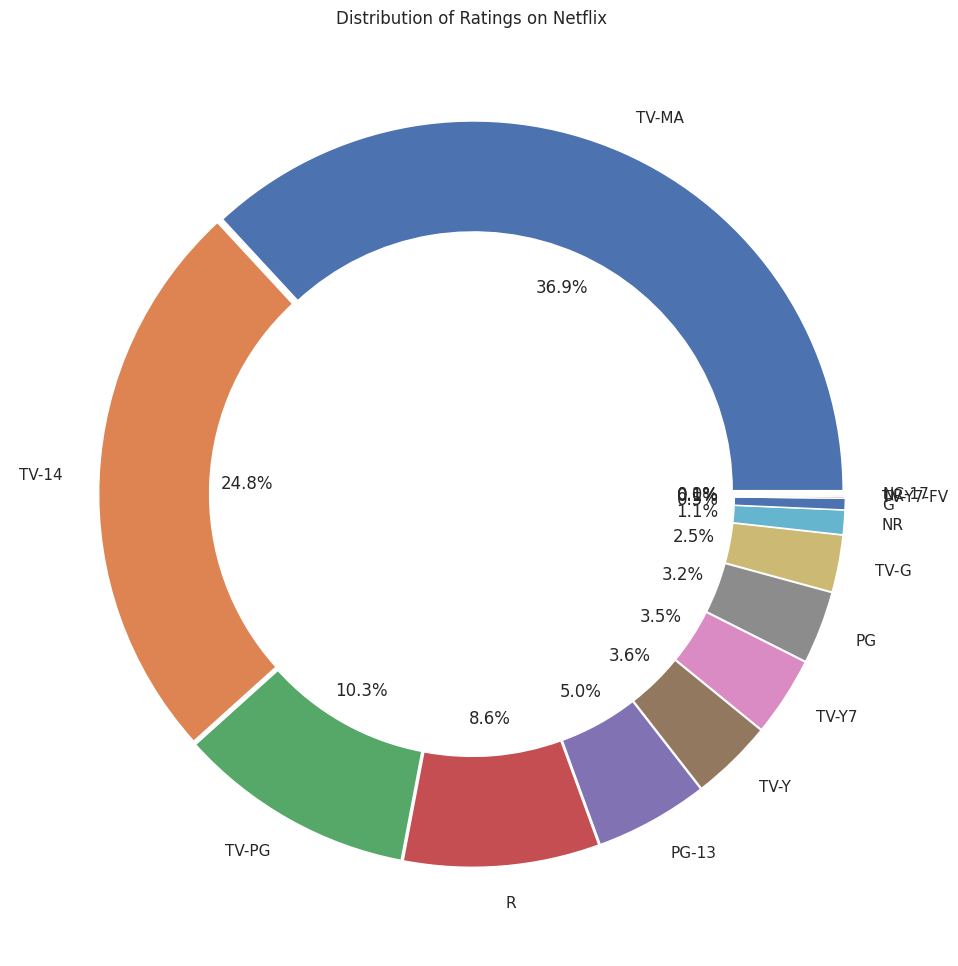

In [ ]:
# Creating a dataframe with counts of each rating
rating_counts = netflix_tv['rating'].value_counts().reset_index()
# Renaming columns
rating_counts.columns = ['rating', 'count']
# Creating a list of explosion values
explode = [0.01] * len(rating_counts)
# Defining the colors
colors = ['#FF6F61', '#6B5B95', '#88B04B', '#F7CAC9', '#92A8D1', '#955251']
# Plotting a pie chart with gaps between the sections
plt.figure(figsize=(12,12))
plt.pie(rating_counts['count'], labels=rating_counts['rating'], autopct='%1.1f%%', explode=explode, wedgeprops=dict(width=0.3))
plt.title('Distribution of Ratings on Netflix')
plt.show()



##### **1. Why did you pick the specific chart?**

*Pie charts are useful for visualizing the proportional representation of different categories or parts of a whole.*

##### **2. What is/are the insight(s) found from the chart?**

*This plot displays the count of different TV show ratings on Netflix, with TV-MA having the highest count followed by TV-14 and TV-PG ratings in second and third place respectively. This information can be useful to identify the most popular TV show ratings on Netflix and help content creators to better understand the preferences of the audience. Additionally, it can assist parents in making informed decisions on what shows are appropriate for their children based on the ratings provided.*

##### **3.Will the gained insights help creating a positive business impact?**
**Are there any insights that lead to negative growth? Justify with specific reason.**

*The business impact of this plot can be positive as it helps content creators and Netflix to better understand the preferences of the audience and make data-driven decisions regarding content creation and acquisition. It can also have a positive impact on parental guidance and ensure appropriate content is provided to children, potentially leading to increased customer satisfaction and retention.*

### **Chart -7 | Top 10 Genres**

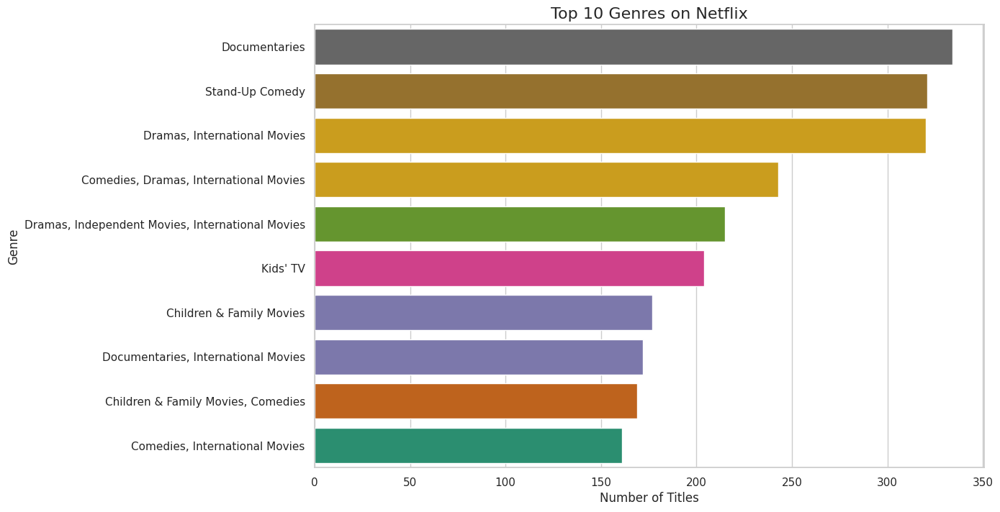

In [ ]:
# Selecting the top 10 genres
top_genres = netflix_tv.listed_in.value_counts().nlargest(10)
# Creating a horizontal bar chart
plt.figure(figsize=(12, 8))
#custom_palette = ['#FF5733', '#C70039', '#900C3F', '#581845']
sns.barplot(x=top_genres.values, y=top_genres.index, palette="Dark2_r")
plt.title('Top 10 Genres on Netflix', fontsize=16)
plt.xlabel('Number of Titles', fontsize=12)
plt.ylabel('Genre', fontsize=12)
plt.show()


##### **1. Why did you pick the specific chart?**

*Bar plots are used for comparing and displaying data across different categories.It is particularly useful when working with categorical data, such as counts or frequencies of different categories. Bar plots allow us to see the relative size of each category and compare them easily.*

##### **2. What is/are the insight(s) found from the chart?**

*The bar plot shows that dramas have the highest number of shows and movies followed by comedies. Action and adventure are also among the top 4 most popular genres.*

##### **3. Will the gained insights help creating a positive business impact?**
**Are there any insights that lead to negative growth? Justify with specific reason.**

*The business impact of the top genres on Netflix can be significant as it can inform the content acquisition and production strategies of the company. By understanding which genres are most popular, Netflix can focus on producing and acquiring more content in those genres to attract and retain subscribers. Additionally, it can also help the company to tailor its marketing efforts to target audiences who prefer specific genres.*

### **Chart -8 | Wordcloud of Title**

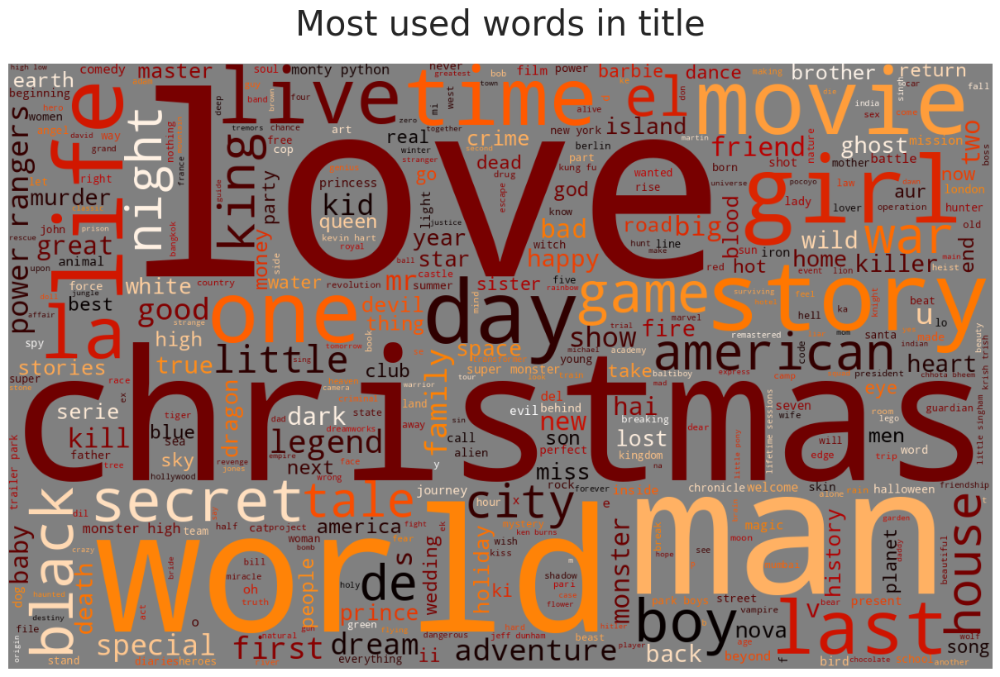

In [ ]:
# Create a string to store all the words.
comment_words = ''

# Remove the stopwords.
stopwords = set(STOPWORDS)
 
# iterate through the column.
for val in netflix_tv.title:
     
    # typecaste each val to string
    val = str(val)
 
    # split the value
    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "
 
wordcloud = WordCloud(width = 1300, height = 800,
                background_color ='grey',
                stopwords = stopwords,
                min_font_size = 10,
                max_words = 1000,
                colormap = 'gist_heat_r').generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (14, 8), facecolor = None)
plt.title('Most used words in title', fontsize = 30, pad=25)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

##### **1. Why did you pick the specific chart?**

*Wordcloud is a popular data visualization technique that allows us to display the most frequent words in a text corpus in an intuitive and visually appealing way.*

##### **2. What is/are the insight(s) found from the chart?**

*The analysis of the titles of movies and TV shows showed that certain words are repeated more frequently such as Christmas, Love, World, Man, and Story. The presence of the word Christmas in the titles could be explained by the fact that most of the content is uploaded during winters, which is the holiday season.*

##### **3. Will the gained insights help creating a positive business impact?**
**Are there any insights that lead to negative growth? Justify with specific reason.**

*The insights gained from analyzing titles could help to optimize search results and improve user experience on the platform, potentially leading to increased engagement and revenue.*

### **Chart-9 | Top 25 Directors in the Dataset**

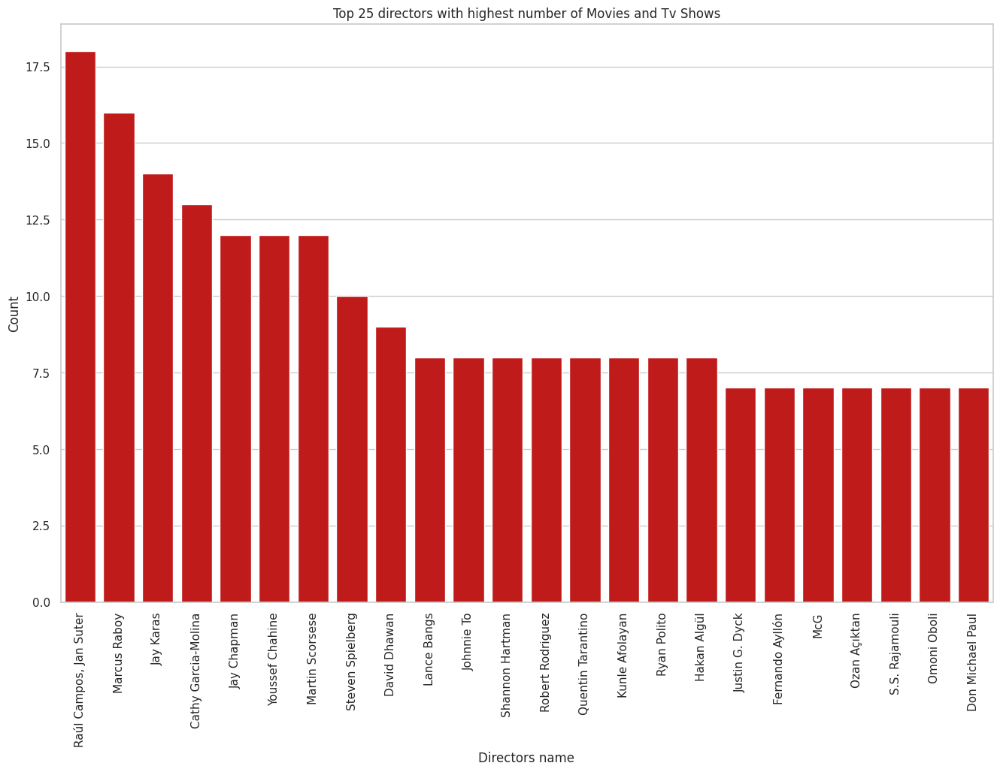

In [ ]:
#creating the list of directors
directors_list = netflix_tv.director.value_counts().reset_index().head(25)[1:]
directors_list.rename(columns={'index':'Directors name', 'director':'Count'}, inplace=True)

# Creating a bar plot with Seaborn
plt.figure(figsize=(16, 10))
sns.barplot(data=directors_list, x="Directors name", y="Count", color="#db0000")

# Setting the title and labels
plt.title("Top 25 directors with highest number of Movies and Tv Shows")
plt.xlabel("Directors name")
plt.ylabel("Count")

# Rotating the x-axis labels for better visibility
plt.xticks(rotation=90)
# Show the plot
plt.show()

##### **1. Why did you pick the specific chart?**

*Bar plots are used for comparing and displaying data across different categories.It is particularly useful when working with categorical data, such as counts or frequencies of different categories. Bar plots allow us to see the relative size of each category and compare them easily*

##### **2. What is/are the insight(s) found from the chart?**

*The analysis revealed that Raúl Campos, Jan Suter, Marcus Raboy, Jay Karas, and Cathy Garcia-Molina are among the top 5 directors with the highest count of movies and TV shows on the platform.*

##### **3. Will the gained insights help creating a positive business impact?** 
**Are there any insights that lead to negative growth? Justify with specific reason.**

*Analyzing the top directors with the highest number of movies and TV shows on Netflix can provide valuable insights into audience preferences and can help the platform make data-driven decisions when it comes to investing in new content. By identifying the most successful directors, Netflix can prioritize collaborations with them and create more content that aligns with their respective styles, which can potentially lead to increased viewership and revenue.*

### **Chart - 10 | Duration of TV shows**

In [ ]:
netflix_tv.shape

(7777, 15)

In [ ]:
# Creating two subsets for and movies.
movies = netflix_tv[netflix_tv['type'] == 'Movie']

# Selecting the durations for both.
duration_movies = movies['duration'].reset_index()

# Removing string values from movie duration.
duration_movies.duration = duration_movies.duration.str.replace(' min', '')                                                       
duration_movies.duration = duration_movies.duration.astype(str).astype(int)

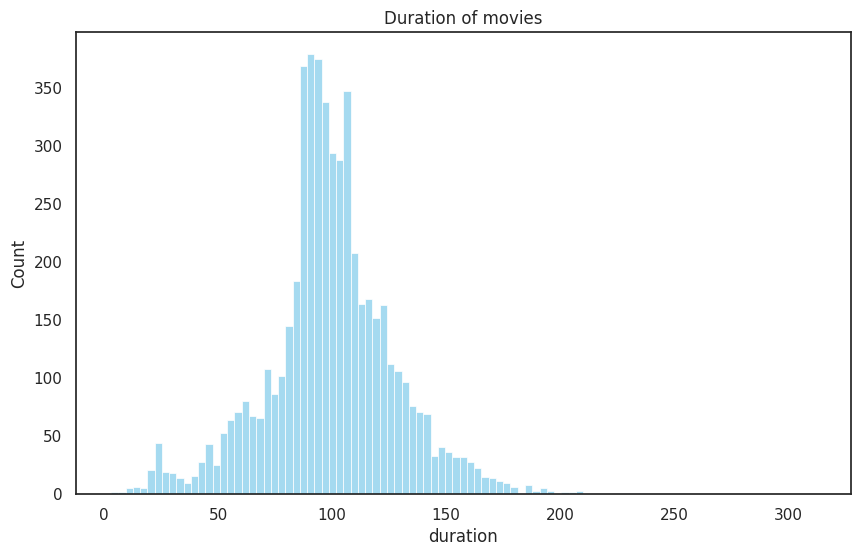

In [ ]:
plt.figure(figsize=(10,6), dpi=100)
sns.set(style="white")
sns.histplot(data=duration_movies['duration'], color='skyblue')
plt.title('Duration of movies')
plt.show()
     

##### **1. Why did you pick the specific chart?**

*A histogram is a graphical representation of the distribution of a dataset. It is used to visualize the frequency distribution of continuous data.* 

##### **2. What is/are the insight(s) found from the chart?**

*This data analysis suggests that a majority of the movies have a runtime between 90 and 120 minutes. it can help viewers to make decisions on which movies to watch based on their preferred length. The insights gained from analyzing movie runtimes can provide valuable guidance to the movie industry in creating content that caters to the preferences of the audience.*

##### **3. Will the gained insights help creating a positive business impact?** 
**Are there any insights that lead to negative growth? Justify with specific reason.**

*This information can be valuable for filmmakers and producers to understand the average length of movies on Netflix and adjust their production accordingly.*

### **Chart - 11 | Number of TV shows Season Distribution**

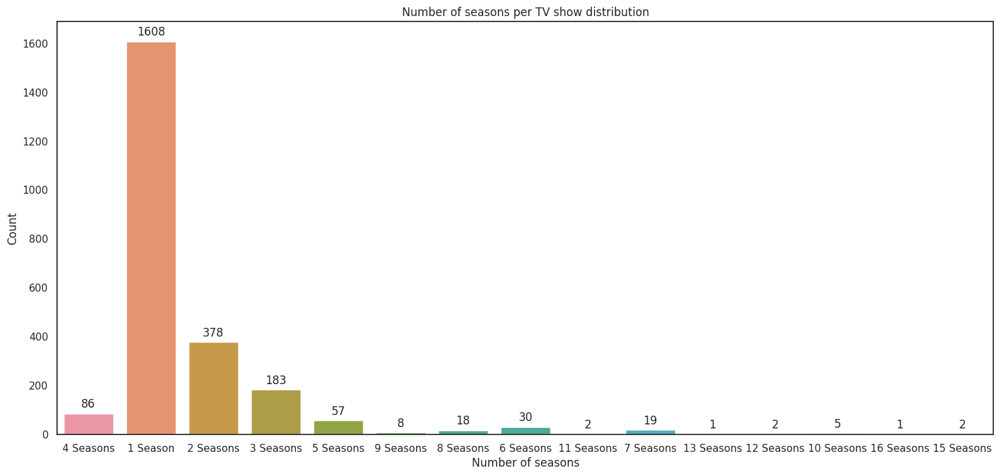

In [ ]:
# Creating the TV Show data from Netflix dataset
netflix_tv_0 = netflix_tv[netflix_tv['type'] == 'TV Show']

# Plotting the countplot
plt.figure(figsize=(18, 8))
ax = sns.countplot(x='duration', data=netflix_tv_0)

# Setting the title and labels
ax.set_title('Number of seasons per TV show distribution')
ax.set_xlabel('Number of seasons')
ax.set_ylabel('Count')

# Adding the count labels on each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10),
                textcoords='offset points')


##### **1. Why did you pick the specific chart?**

*A countplot is a useful visualization tool in data analysis that allows us to visualize the count of observations in each categorical bin using bars*. 

##### **2. What is/are the insight(s) found from the chart?**

*This graph displays the count of the number of seasons in each TV show on Netflix, with the highest number of shows having only one season followed by those with two seasons and three seasons. The information can be useful for identifying the most common patterns of TV show production and guide content creators in making decisions about the length of the TV show they should produce. Moreover, this information can assist viewers in selecting TV shows based on the number of seasons available, as some viewers may prefer long-running TV shows while others may prefer shorter ones.*

##### **3. Will the gained insights help creating a positive business impact?** 
**Are there any insights that lead to negative growth? Justify with specific reason.**

*The analysis of the number of seasons in TV shows can help content creators and production companies in deciding the optimal number of seasons for their TV shows based on popular trends and audience preferences. This can potentially lead to increased viewership and revenue.*

In [ ]:
netflix_tv_0.shape

(2400, 15)

### **Chart - 12 | Correlation Heatmap**

In [ ]:
# Creating new column for age rating
rating_ages = {'TV-PG': 'Older Kids','TV-MA': 'Adults','TV-Y7-FV': 'Older Kids','TV-Y7': 'Older Kids','TV-14': 'Young Adults','R': 'Adults','TV-Y': 'Kids','NR': 'Adults','PG-13': 'Teens','TV-G': 'Kids','PG': 'Older Kids','G': 'Kids','UR': 'Adults','NC-17': 'Adults'}
netflix_tv['age_rating'] = netflix_tv['rating'].replace(rating_ages)
netflix_tv['age_rating'].unique()

array(['Adults', 'Teens', 'Young Adults', 'Older Kids', 'Kids'],
      dtype=object)

In [ ]:
# getting country wise count value
netflix_tv['count'] = 1
data = netflix_tv.groupby('country')[['country','count']].sum().sort_values(by='count',ascending=False).reset_index()[:10]
data = data['country']

Netflix_df_heatmap = netflix_tv.loc[netflix_tv['country'].isin(data)]
Netflix_df_heatmap = pd.crosstab(Netflix_df_heatmap['country'], Netflix_df_heatmap['age_rating'],normalize = "index").T
Netflix_df_heatmap

country,,Canada,Egypt,France,India,Japan,South Korea,Spain,United Kingdom,United States
age_rating,,,,,,,,,,
Adults,0.320158,0.446328,0.277228,0.678261,0.255688,0.368889,0.469945,0.835821,0.512626,0.502942
Kids,0.169960,0.180791,0.000000,0.095652,0.016251,0.008889,0.027322,0.022388,0.093434,0.073362
Older Kids,0.235178,0.225989,0.039604,0.060870,0.160347,0.271111,0.120219,0.044776,0.204545,0.187132
Teens,0.005929,0.016949,0.000000,0.008696,0.004334,0.013333,0.000000,0.007463,0.017677,0.089055
Young Adults,0.268775,0.129944,0.683168,0.156522,0.563380,0.337778,0.382514,0.089552,0.171717,0.147509


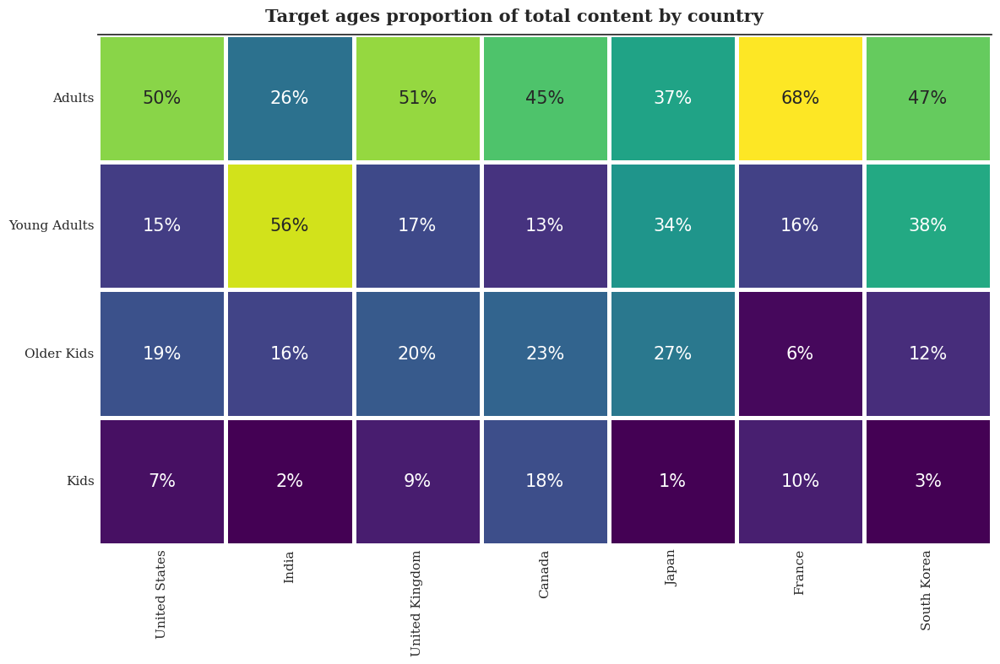

In [ ]:
# Plotting the heatmap
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
country_order2 = ['United States', 'India', 'United Kingdom', 'Canada', 'Japan', 'France', 'South Korea']

age_order = ['Adults', 'Young Adults', 'Older Kids', 'Kids']

sns.heatmap(Netflix_df_heatmap.loc[age_order,country_order2],cmap="viridis",square=True, linewidth=2.5,cbar=False,
            annot=True,fmt='2.0%',vmax=.6,vmin=0.05,ax=ax,annot_kws={"fontsize":15})

ax.spines['top'].set_visible(True)

fig.text(.76,.765, 'Target ages proportion of total content by country', fontweight='bold', fontfamily='serif', fontsize=15,ha='right')   

ax.set_yticklabels(ax.get_yticklabels(), fontfamily='serif', rotation = 0, fontsize=11)
ax.set_xticklabels(ax.get_xticklabels(), fontfamily='serif', rotation=90, fontsize=11)

ax.set_ylabel('')    
ax.set_xlabel('')
ax.tick_params(axis=u'both', which=u'both',length=0)
plt.tight_layout()
plt.show()

##### 1**. Why did you pick the specific chart?**

*In a correlation heatmap, the strength and direction of the correlation between pairs of variables are represented by colors.*

##### **2. What is/are the insight(s) found from the chart?**

*United States and the United Kingdom, the two nations show a high degree of alignment. However, when compared to nations like India or Japan, the target ages are radically different. This observation indicates that there may be significant cultural differences in entertainment preferences between these nations.*

### **Chart - 13 | Genre Countrywise**

In [ ]:
#genre country wise
def get_genre_country_trends(netflix_tv):
  def explode_country(country):
    try:
        return country.split(", ")
    except:
        return ""
  netflix_tv['country_list'] = netflix_tv.apply(lambda x: explode_country(x['country']),axis=1)
  netflix_tv= netflix_tv.explode('country_list')
  netflix_tv['genre_list'] = netflix_tv.apply(lambda x: explode_country(x['listed_in']),axis=1)
  netflix_tv = netflix_tv.explode('genre_list')
  netflix_tv.groupby(['country_list','genre_list']).agg({'title':'count'})
  grouped_df_ = netflix_tv.groupby(['country_list','genre_list']).agg({'title':'count'})
  grouped_df = grouped_df_.reset_index()
  grouped_df['country_list'].values
  grouped_df = grouped_df[grouped_df.country_list != '']
  rating_country_df = grouped_df.reset_index().drop("index", axis=1)
  list_of_countries = list(set(list(rating_country_df['country_list'].values)))
  for each in list_of_countries:
    rating_country_df[rating_country_df['country_list'] == each].sort_values("title",ascending=False).plot.bar(x = "genre_list", y="title", color="orange", rot=90, figsize=(9,5))
    plt.title(f"{each}")
  return rating_country_df

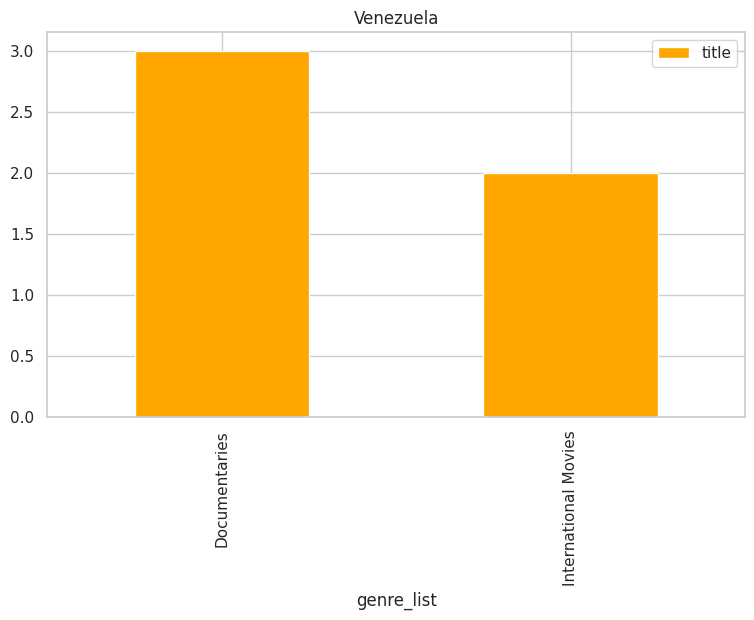

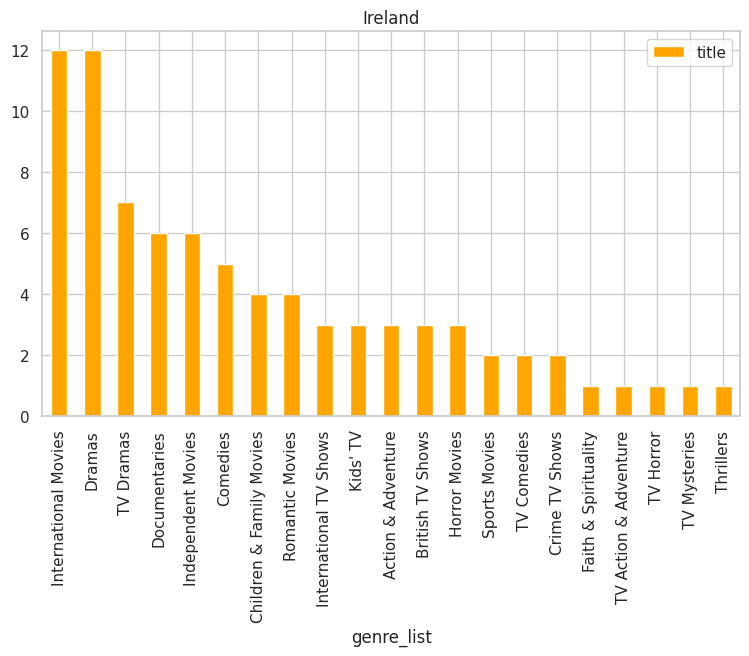

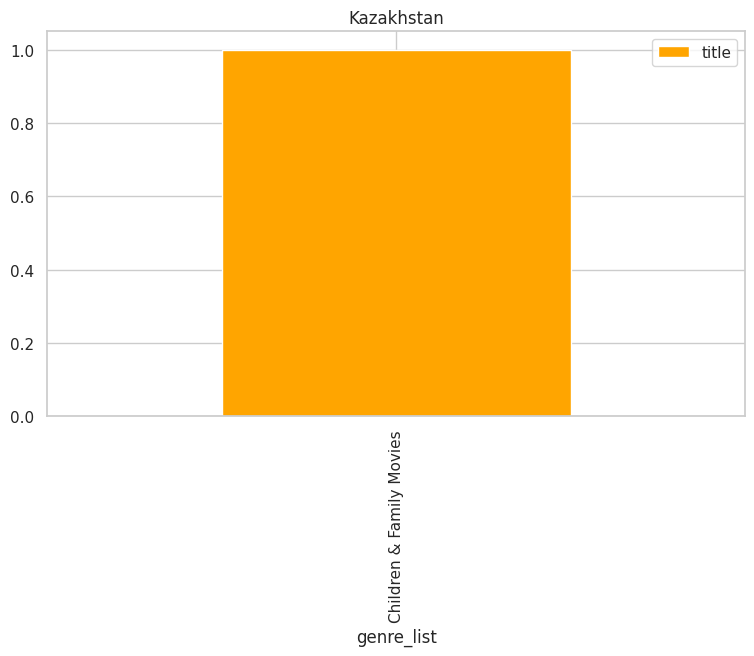

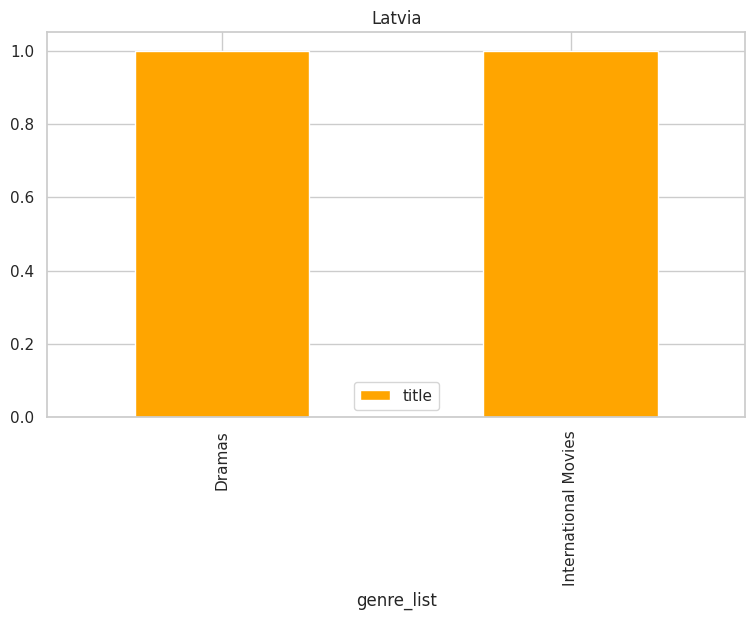

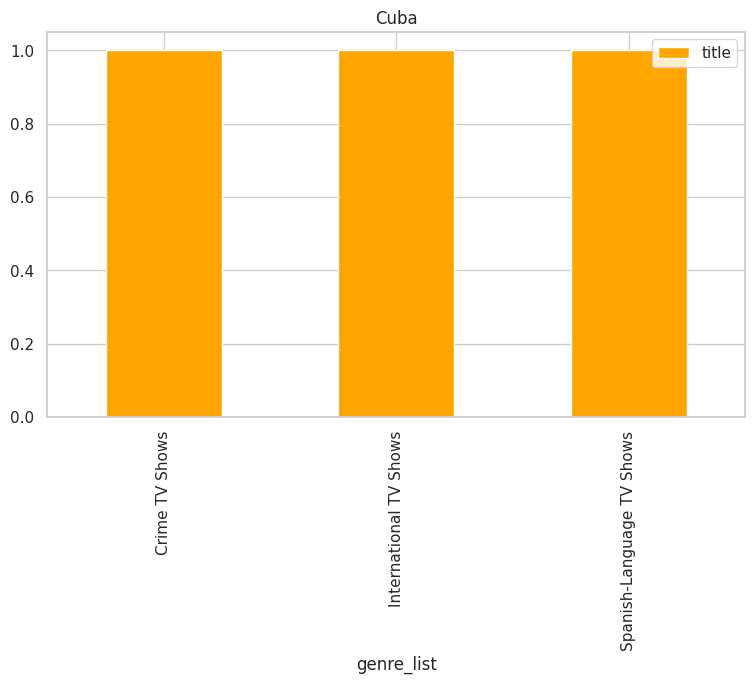

...

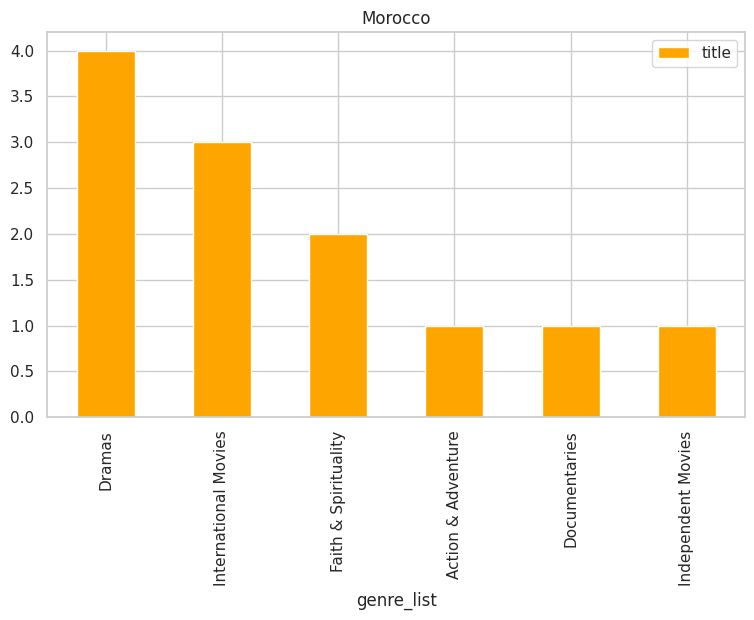

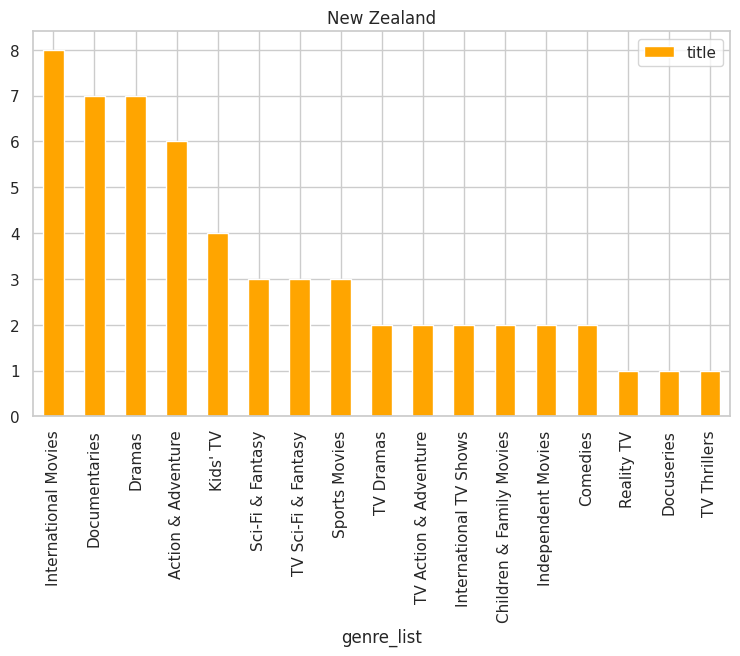

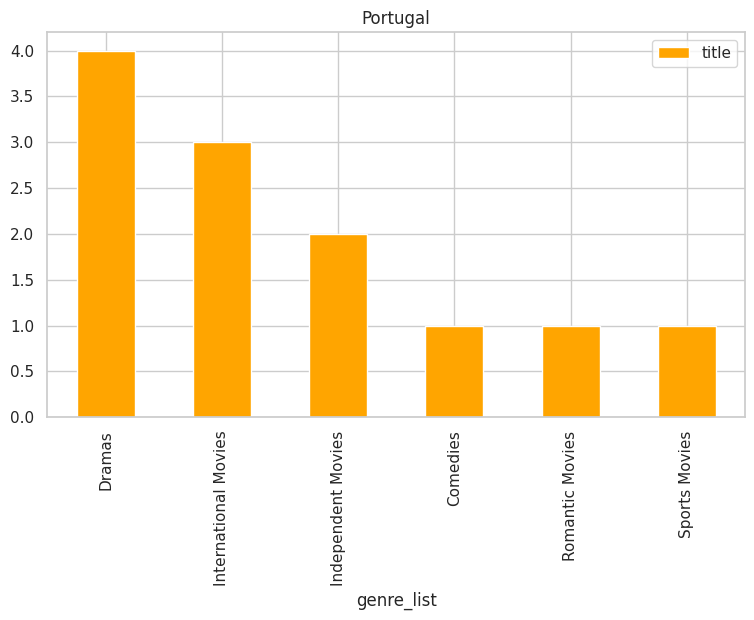

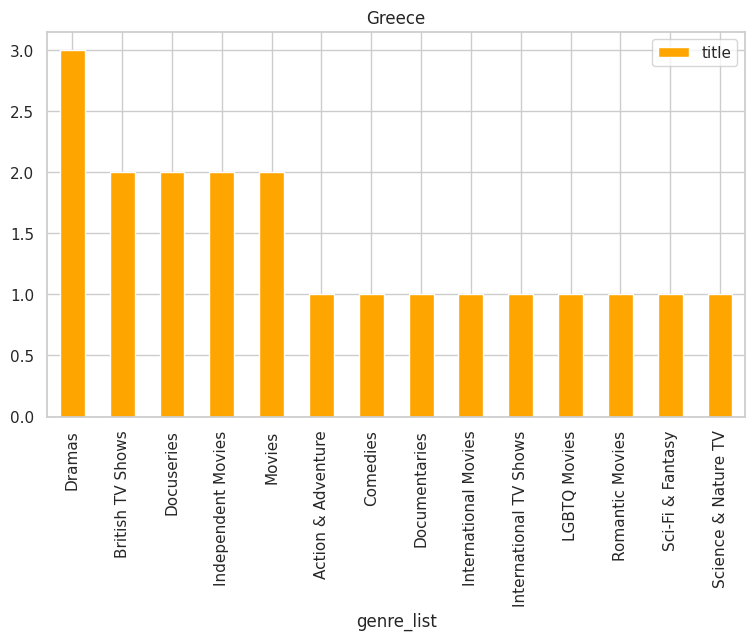

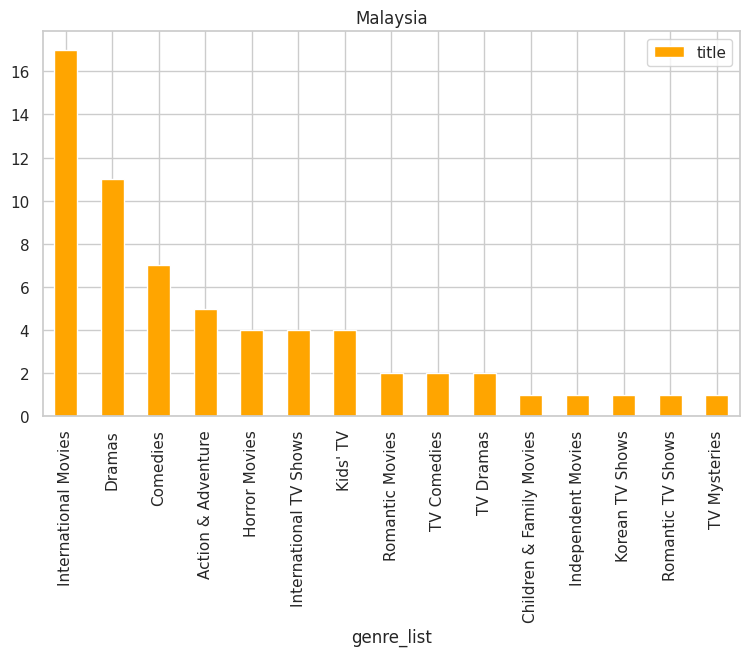

In [ ]:
rating_country_df = get_genre_country_trends(netflix_tv)


## ***4. Hypothesis Testing***

* *Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing*

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

***Does the average rating of TV shows differ significantly from the average rating of movies***

#### 2. Perform an appropriate statistical test.

In [ ]:
import scipy.stats as stats

# Defining a function to directly convert rating to float or NaN
def convert_rating(x):
    try:
        return float(x)
    except:
        return np.nan
#ratings for movie and tv
movie_ratings = netflix_tv[(netflix_tv['type'] == 'Movie') & (netflix_tv['rating'].notnull())]['rating'].apply(convert_rating)
tv_ratings = netflix_tv[(netflix_tv['type'] == 'TV Show') & (netflix_tv['rating'].notnull())]['rating'].apply(convert_rating)

#ejecting the  NaN values
movie_ratings = movie_ratings.dropna()
tv_ratings = tv_ratings.dropna()

#two-sample t-test
t_stat, p_val = stats.ttest_ind(movie_ratings, tv_ratings, equal_var=False)

# Checking the p-value
if p_val < 0.05:
    print("There is a significant difference in average ratings between movies and TV shows.")
else:
    print("There is no significant difference in average ratings between movies and TV shows.")




There is no significant difference in average ratings between movies and TV shows.


##### Which statistical test have you done to obtain P-Value?

*Two Sample T-test*

##### Why did you choose the specific statistical test?

*Two sample t test is typically used when the data is normally distributed and the variances of the two populations are assumed to be equal (although there is also a variant called Welch's t-test that can be used when the variances are not equal).*

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

***Is there a difference in the average duration of movies and TV shows?***

#### 2. Perform an appropriate statistical test.

In [ ]:
#  the average durations for movies and TV shows
movie_durations = netflix_tv[netflix_tv['type'] == 'Movie']['duration'].str.extract('(\d+)', expand=False).astype(float)
tv_durations = netflix_tv[netflix_tv['type'] == 'TV Show']['duration'].str.extract('(\d+)', expand=False).astype(float)

#two-sample t-test
t_stat, p_val = stats.ttest_ind(movie_durations, tv_durations, equal_var=False)

# Checking the p-value
if p_val < 0.05:
    print("There is a significant difference in average duration between movies and TV shows.")
else:
    print("There is no significant difference in average duration between movies and TV shows.")


There is a significant difference in average duration between movies and TV shows.


##### Which statistical test have you done to obtain P-Value?

*Two Sample T-test*

##### Why did you choose the specific statistical test?

*Two sample t test is typically used when the data is normally distributed and the variances of the two populations are assumed to be equal (although there is also a variant called Welch's t-test that can be used when the variances are not equal).*

### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

***Do the types of genres listed for movies differ significantly from the types of genres listed for TV shows?***

#### 2. Perform an appropriate statistical test.

In [ ]:
# Creating a table of movie genres vs. TV show genres
movie_genres = netflix_tv[netflix_tv['type'] == 'Movie']['listed_in'].str.get_dummies(', ')
tv_genres = netflix_tv[netflix_tv['type'] == 'TV Show']['listed_in'].str.get_dummies(', ')
genre_table = pd.concat([movie_genres.sum(), tv_genres.sum()], axis=1)
genre_table.columns = ['Movies', 'TV Shows']

# Performing a chi-squared test of independence
chi2_stat, p_val, dof, expected = stats.chi2_contingency(genre_table)

# Checking the p-value
if p_val < 0.05:
    print("There is a significant association between the type of content and the genres listed.")
else:
    print("There is no significant association between the type of content and the genres listed.")


There is no significant association between the type of content and the genres listed.


##### Which statistical test have you done to obtain P-Value?

*Chi-squared test*

##### Why did you choose the specific statistical test?

*The chi-squared test is used to determine whether there is a significant association between two categorical variables. It is often used to analyze data in which the categories are mutually exclusive and there are a large number of observations.*

## **5. Textual Data Preprocessing** 
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

*First we will be Choosing  the attributes that you want to use for clustering the shows. These attributes could be features such as the genre, the cast, the director, or the language of the show.*

*Then we will perform text preprocessing on the textual data associated with the shows. This could involve removing all stop words and punctuation marks, and converting all the text to lowercase.*

*Now we will apply stemming techniques to generate meaningful words out of the corpus of words associated with each show.*

*Moving ahead we will Tokenize the corpus of words and use word vectorization techniques to transform the textual data into a numerical format that can be* *used for clustering.*

*Then we will Perform dimensionality reduction on the vectorized data to reduce its dimensionality and make it more manageable for clustering algorithms.*



### ***Clustering Varibales***

*In this project, we aim to cluster the movies and TV shows available on Netflix by using several attributes. These attributes include the director of the movie/show, the cast members, the country where the movie/show was produced, the rating given to the movie/show, the genres that the movie/show is listed in, and the description of the movie/show. By clustering the movies/shows based on these attributes, we can potentially identify patterns and similarities between the different productions available on Netflix.*

In [ ]:
# Creating tags column from all text columns, which is used for model building.
netflix_tv['tags'] =netflix_tv['description'] + netflix_tv['listed_in'] + netflix_tv['rating'] + netflix_tv['cast'] + netflix_tv['country'] + netflix_tv['director']

In [ ]:
netflix_tv['tags']

0       In a future where the elite inhabit an island ...
1       After a devastating earthquake hits Mexico Cit...
2       When an army recruit is found dead, his fellow...
3       In a postapocalyptic world, rag-doll robots hi...
4       A brilliant group of students become card-coun...
                              ...                        
7782    When Lebanon's Civil War deprives Zozo of his ...
7783    A scrappy but poor boy worms his way into a ty...
7784    In this documentary, South African rapper Nast...
7785    Dessert wizard Adriano Zumbo looks for the nex...
7786    This documentary delves into the mystique behi...
Name: tags, Length: 7777, dtype: object

#### 1. Lower Casing

*Lowercasing is a text pre-processing step that involves converting all words in a text to their lowercase form. This can help in treating words with different capitalizations as the same word, making it useful for text classification or information retrieval tasks. Additionally, lowercasing can also help in reducing the size of the vocabulary, which can be advantageous when working with large texts or languages that have many inflected forms.*

In [ ]:
# Converting all text to lowercase
netflix_tv['description'] = netflix_tv['description'].str.lower()

# Printing the first few rows of the dataset to check if the lowercasing has been applied correctly
print(netflix_tv.head())


  show_id     type  title           director  \
0      s1  TV Show     3%                      
1      s2    Movie   7:19  Jorge Michel Grau   
2      s3    Movie  23:59       Gilbert Chan   
3      s4    Movie      9        Shane Acker   
4      s5    Movie     21     Robert Luketic   

                                                cast        country  \
0  João Miguel, Bianca Comparato, Michel Gomes, R...         Brazil   
1  Demián Bichir, Héctor Bonilla, Oscar Serrano, ...         Mexico   
2  Tedd Chan, Stella Chung, Henley Hii, Lawrence ...      Singapore   
3  Elijah Wood, John C. Reilly, Jennifer Connelly...  United States   
4  Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...  United States   

  date_added  release_year rating   duration  \
0 2020-08-14          2020  TV-MA  4 Seasons   
1 2016-12-23          2016  TV-MA     93 min   
2 2018-12-20          2011      R     78 min   
3 2017-11-16          2009  PG-13     80 min   
4 2020-01-01          2008  PG-13    123 min

#### 2. Removing Punctuations

In [ ]:
#definig a function to remove punctuation
def remove_punctuation(text):
    '''
    A function to remove punctuation marks from text.
    '''
    # Create a string translator object to map each punctuation mark to None (i.e. delete it)
    translator = str.maketrans('', '', string.punctuation)

    # Use the string translator to delete all punctuation marks from the text
    cleaned_text = text.translate(translator)

    return cleaned_text


In [ ]:
# applying remove_punctuation function
netflix_tv['tags'] = netflix_tv['tags'].apply(remove_punctuation)

#### 3. Removing URLs & Removing words and digits contain digits.

In [ ]:
# Removing the URLs from the 'description' column
netflix_tv['description'] = netflix_tv['description'].apply(lambda x: re.sub(r'http\S+', '', x))

# Removing the  words containing digits from the 'description' column
netflix_tv['description'] = netflix_tv['description'].apply(lambda x: re.sub(r'\w*\d\w*', '', x))


#### 4. Removing Stopwords & Removing White spaces

In [ ]:
import nltk
from nltk.corpus import stopwords

# Download stop words
nltk.download('stopwords')

# Define stop words
stop_words = set(stopwords.words('english'))

# Function to remove stop words and white spaces
def preprocess_text(text):
    # Remove white spaces
    text = text.strip()
    # Remove stop words
    text = " ".join([word for word in text.split() if word.lower() not in stop_words])
    return text

# Apply the preprocess_text function to the 'description' column
netflix_tv['description'] = netflix_tv['description'].apply(preprocess_text)



[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### 5. Stemming/Lemmatization

*The process of stemming involves reducing a word to its base or root form, which is useful for natural language processing tasks. By reducing different inflected forms of a word to their base form, a stemmer allows you to treat* *them as the same word, which can be helpful for tasks such as text classification or information retrieval. For instance, the words "run," "runs,"* "*ran," and "running" are different forms of the same word "run," and a stemmer can simplify them all to the base form "run." In our case, we used the SnowballStemmer algorithm to generate a meaningful word out of a corpus of words.*

In [ ]:
# creating an object of Porter stemming function
stemmer = PorterStemmer()
def stemming(text):    
    '''a function which stems each word in the given text using Porter Stemmer'''
    text = [stemmer.stem(word) for word in text.split()]
    return " ".join(text)

# applying stemming function
netflix_tv['tags'] = netflix_tv['tags'].apply(stemming)



#### 6. Text Vectorization
*Word/Text vectorization is the process of representing words as numerical vectors. This is important in NLP tasks because most machine learning models expect numerical input and cannot work with raw text data directly. Word vectorization allows you to input the words into a machine learning model in a way that preserve the meaning and context of the words. Word vectorization can also be used to measure the similarity between words using vector arithmetic.*

*CountVectorizer is a text preprocessing technique in Natural Language Processing (NLP) that converts a collection of text documents into a matrix of token counts. It is a simple way to represent a large amount of textual data in a structured format that can be analyzed using machine learning models.*

In [ ]:
#creating a CountVectorizer object with stop words and a maximum of 10000 features
count_vect = CountVectorizer(stop_words='english', lowercase=False, max_features=10000)
#Fitting the CountVectorizer object to the 'tags' column of the Netflix TV dataframe
count_vect.fit(netflix_tv['tags'])
dictionary = count_vect.vocabulary_.items()


In [ ]:
print(len(dictionary))

10000


In [ ]:
# converting the vector into array form for clustering
vector = cv.transform(netflix_tv['tags']).toarray()

# encoded vector
print(vector)
print(f'shape of the vector : {vector.shape}')
print(f'datatype : {type(vector)}')


[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
shape of the vector : (7777, 10000)
datatype : <class 'numpy.ndarray'>


##### Which text vectorization technique have you used and why?

*CountVectorizer is another way of converting text data into numerical form. It converts text into a matrix of word counts, where each row represents a document or piece of text, and each column represents a unique word in the corpus. The values in the matrix are the count of the number of times each word appears in each document.*

### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

*To reduce the dimensionality of the data, we will use PCA (Principal Component Analysis).*
*Dimensionality reduction is the process of reducing the number of features or dimensions in a dataset while preserving as much information as possible.*

In [ ]:
# using PCA to reduce dimensionality
pca = PCA(random_state=50)
pca.fit(vector)

PCA(random_state=50)

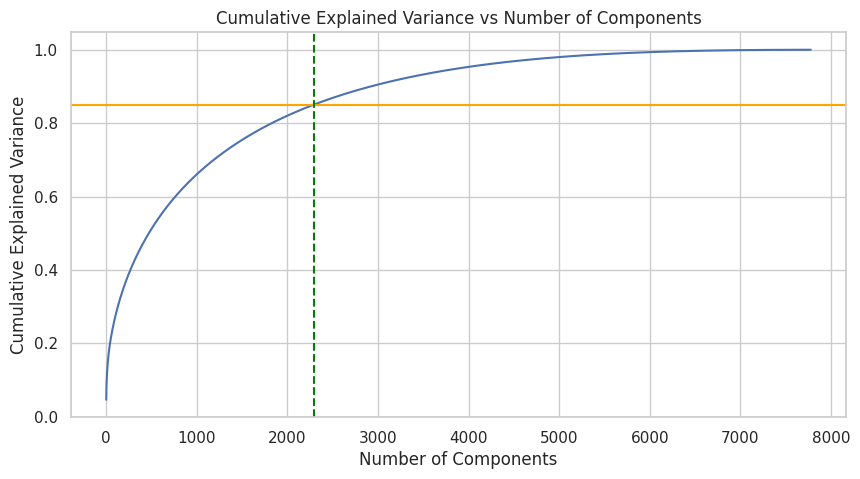

In [ ]:
# Code to  plot of cumulative explained variance vs number of components
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
plt.figure(figsize=(10,5))
plt.plot(cumulative_variance)
plt.title('Cumulative Explained Variance vs Number of Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')

# Adding a horizontal line for 0.85 cumulative explained variance
plt.axhline(y=0.85, color='orange', linestyle='solid')

# Adding a vertical line for the number of components with 0.85 cumulative explained variance
num_components = np.argmax(cumulative_variance >= 0.85)
plt.axvline(x=num_components, color='green', linestyle='--')

plt.show()


##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

*Based on our analysis, we have found that a large number of components are required to explain all the variance in the data. In fact, we found that it takes approximately 7500 components to explain 100% of the variance in the data. However, we also discovered that a significant portion of the variance can be explained by a smaller number of components. Specifically, more than 85% of the variance can be explained by just 2300 components.*

*Given these findings, we recommend using the top 2300 components to simplify the model and reduce dimensionality. This approach will still capture the vast majority of the variance in the data, while greatly reducing the number of components required. By reducing the dimensionality of the data, we can improve the efficiency and interpretability of our model.*

In [ ]:
# reducing the dimensions to 2300 using pca
pca = PCA(n_components=2300, random_state=50)
pca.fit(vector)

PCA(n_components=2300, random_state=50)

In [ ]:
# transformed features
X = pca.transform(vector)

# shape of transformed vectors
X.shape

(7777, 2300)

In [ ]:
X

array([[ 2.47092782, -0.09298839,  0.00983472, ..., -0.10383531,
         0.05833221, -0.05406886],
       [-0.49814513, -0.31079765,  0.43943348, ..., -0.02082722,
        -0.05165953,  0.01358825],
       [-0.70880374,  0.68559226,  0.63123186, ..., -0.0108008 ,
         0.01229382,  0.02387418],
       ...,
       [-0.69699209, -0.44116702,  0.76474555, ...,  0.00896366,
         0.00468805,  0.00497228],
       [ 0.5442647 , -0.49278917, -0.28550854, ..., -0.03424303,
        -0.01817863,  0.04644784],
       [-0.513918  , -0.85086471, -0.73664387, ...,  0.02004299,
         0.00811322, -0.05718266]])

### 8. CLUSTERING

*Applying different clustering algorithms to the data and evaluate the optimal number of clusters using various techniques such as the elbow method, silhouette analysis, or gap statistic.*

*Once we have identified the optimal number of clusters, we will build the clusters and examine the contents of each cluster using word clouds or other visualization techniques. This can help  us to provide insights into the characteristics of the shows that are grouped together in each cluster.*

In [ ]:
!pip install kneed


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


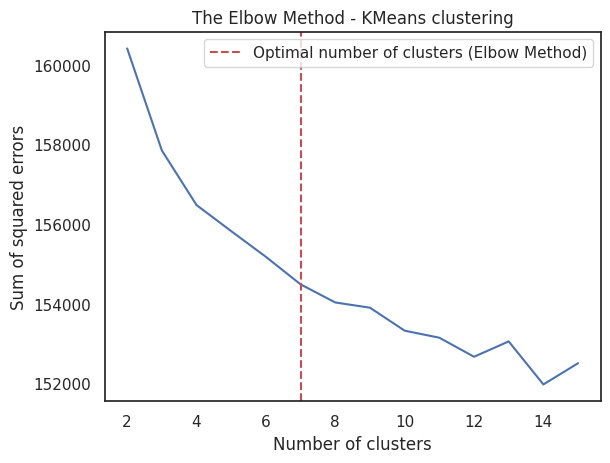

Optimal number of clusters (Elbow Method): 7


In [ ]:
from sklearn.metrics import silhouette_score
from kneed import KneeLocator

# Initializing a list to store the silhouette score for each value of k
silhouette_scores = []
SSE = []

for k in range(2, 16):
    # Initialize the k-means model with the current value of k
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=50)
    # Fitting the model to the data
    kmeans.fit(X)
    # Predicting the cluster labels for each point in the data
    labels = kmeans.labels_
    # Computing the silhouette score for the model
    score = silhouette_score(X, labels)
    silhouette_scores.append(score)
    # Computing the sum of squared errors for the model
    SSE.append(kmeans.inertia_)

# Finding the optimal number of clusters using the elbow method
kl = KneeLocator(range(2, 16), SSE, curve="convex", direction="decreasing")
optimal_clusters_elbow = kl.elbow

# Plotting the results
plt.plot(range(2, 16), SSE)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared errors')
plt.axvline(x=optimal_clusters_elbow, linestyle='--', color='r', label='Optimal number of clusters (Elbow Method)')
plt.legend()
plt.show()
print("Optimal number of clusters (Elbow Method): {}".format(optimal_clusters_elbow))



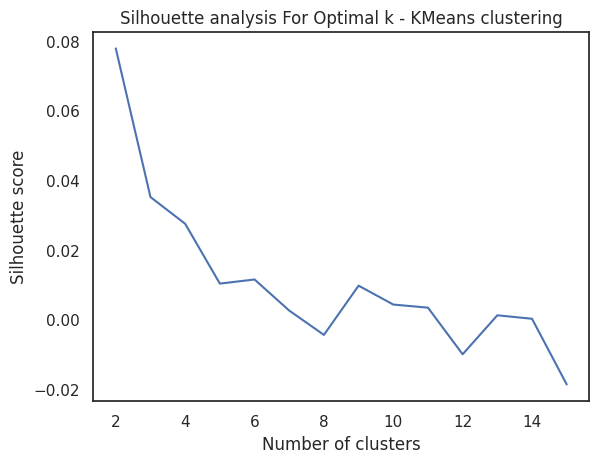

In [ ]:
from sklearn.metrics import silhouette_score
# Initializing a list to store the silhouette score for each value of k
silhouette_scores = []

for k in range(2, 16):
  # Initializing the k-means model with the current value of k
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=50
                  )
  # Fitting the model to the data
  kmeans.fit(X)
  # Predicting the cluster labels for each point in the data
  labels = kmeans.labels_
  # Computing the silhouette score for the model
  score = silhouette_score(X, labels)
  silhouette_scores.append(score)
  
# Plotting the Silhouette analysis
plt.plot(range(2,16), silhouette_scores)
plt.xlabel('Number of clusters') 
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()


In [ ]:
# Clustering the data into 7 clusters
kmeans = KMeans(n_clusters=7, init='k-means++', random_state=50)
kmeans.fit(X)

KMeans(n_clusters=7, random_state=50)

In [ ]:
from sklearn.metrics import silhouette_score
# Calculating distortion and Silhouette score
distortion = kmeans.inertia_
silhouette_score = silhouette_score(X, kmeans.labels_)

# Printing the results
print("Distortion: {}".format(distortion))
print("Silhouette Score: {}".format(silhouette_score))


Distortion: 154495.62233729506
Silhouette Score: 0.0026475580233202936


In [ ]:
# Adding a kmeans cluster number attribute
netflix_tv['kmeans_cluster'] = kmeans.labels_

In [ ]:
netflix_tv.sample(10)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'kmeans_cluster']]

,type,title,director,cast,country,rating,listed_in,description,kmeans_cluster
658,Movie,Baahubali 2: The Conclusion (Tamil Version),S.S. Rajamouli,"Prabhas, Rana Daggubati, Anushka Shetty, Taman...",,TV-MA,"Action & Adventure, Dramas, International Movies","avenge father's death, young man leads army ba...",5
44,Movie,Æon Flux,Karyn Kusama,"Charlize Theron, Marton Csokas, Jonny Lee Mill...",United States,PG-13,"Action & Adventure, Sci-Fi & Fantasy","aiming hasten uprising, leader underground reb...",5
5113,Movie,Ready,Anees Bazmee,"Salman Khan, Asin, Paresh Rawal, Mahesh Manjre...",India,TV-PG,"Comedies, International Movies, Romantic Movies","bollywood superstar salman khan plays prem, he...",0
1435,TV Show,Club Friday To Be Continued - My Beautiful Tomboy,,"Puttichai Kasetsin, Lalana Kongtoranin",,TV-MA,"International TV Shows, Romantic TV Shows, TV ...",change sexual identity complicates young meen'...,6
2003,TV Show,Enemigo íntimo,,"Raúl Méndez, Fernanda Castillo, Matias Novoa, ...",,TV-MA,"Crime TV Shows, Spanish-Language TV Shows, TV ...",siblings separated children longer recognize p...,6
3653,Movie,Listen,Philippe Aractingi,"Hadi Bou Ayash, Ruba Zarour, Yara Bou Nassar, ...",Lebanon,TV-MA,"Dramas, Independent Movies, International Movies",sound engineer falls model unfortunate acciden...,0
3532,Movie,Larry the Cable Guy: Remain Seated,Brian Volk-Weiss,Larry the Cable Guy,United States,TV-14,Stand-Up Comedy,"signature call ""git-r-done,"" larry muses swamp...",5
2165,Movie,Final Destination 3,James Wong,"Mary Elizabeth Winstead, Ryan Merriman, Kris L...","United States, Germany",R,Horror Movies,girl prevents premonition deadly roller-coaste...,3
500,Movie,Anaamika,Sekhar Kammula,"Nayantara, Vaibhav Reddy, Pasupathy, Harshvard...",India,TV-14,"International Movies, Thrillers","woman scours hyderabad missing husband, become...",0
7055,Movie,Thomas & Friends: Thomas and the Royal Engine,Joey So,"Rosamund Pike, Joseph May, Keith Wickham, Shar...",,TV-Y,Children & Family Movies,invitation queen sends thomas crew london weav...,1


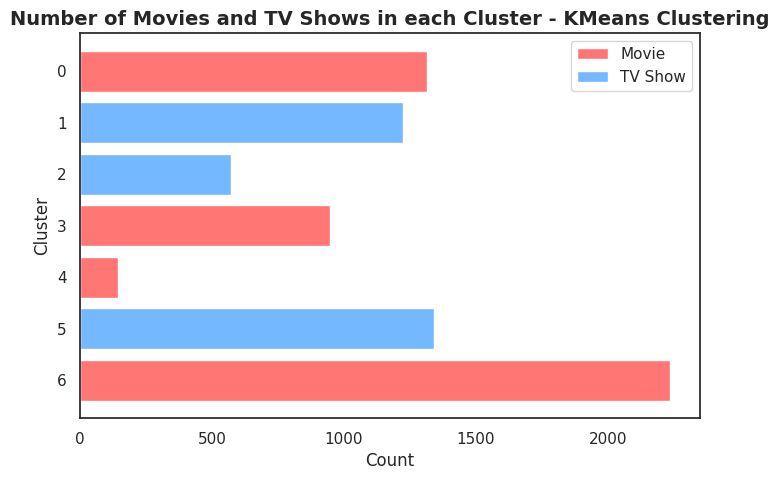

In [ ]:
# Setting the  figure size
plt.figure(figsize=(8, 5))

# Creating the  bar plot
graph = plt.barh(netflix_tv['kmeans_cluster'].unique(), 
                 netflix_tv['kmeans_cluster'].value_counts(), 
                 color=['#ff7675', '#74b9ff'])

# Setting plot title and axis labels
plt.title('Number of Movies and TV Shows in each Cluster - KMeans Clustering', fontsize=14, fontweight='bold')
plt.xlabel('Count', fontsize=12)
plt.ylabel('Cluster', fontsize=12)

# Adding legend
plt.legend(handles=graph, labels=['Movie', 'TV Show'], loc='upper right')

# Inverting y-axis to have highest count at top
plt.gca().invert_yaxis()
plt.show()



In [ ]:
#function for Building a wordcloud for the movie/shows
def kmeans_wordcloud(cluster_number, column_name, width=800, height=400):

  df_wordcloud = netflix_tv[['kmeans_cluster',column_name]].dropna()
  df_wordcloud = df_wordcloud[df_wordcloud['kmeans_cluster']==cluster_number]
  text = " ".join(word for word in df_wordcloud[column_name])
  # creating the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="brown", width=width, height=height).generate(text)
  # Generating a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()


***Representation of Cast Variable for different clusters through WordCloud***

cluster 0


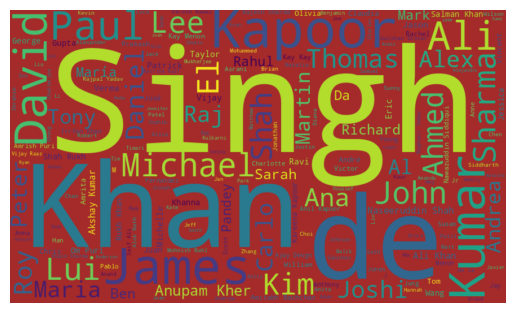

cluster 1


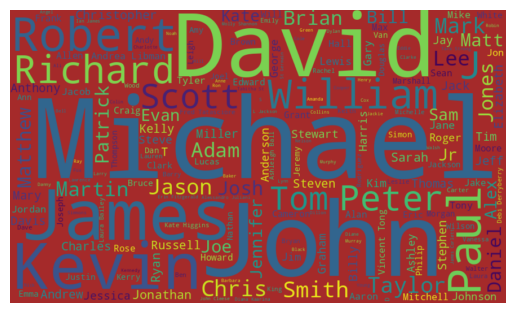

cluster 2


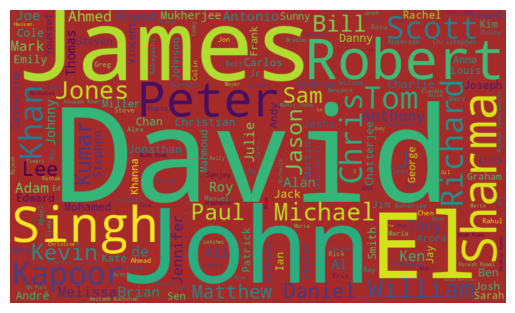

cluster 3


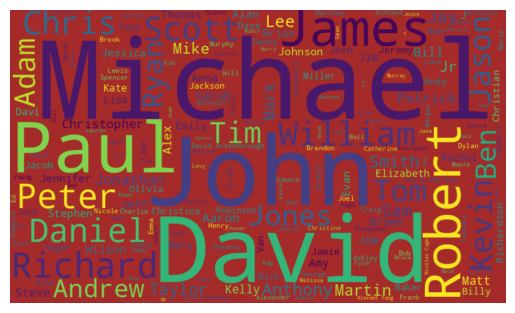

cluster 4


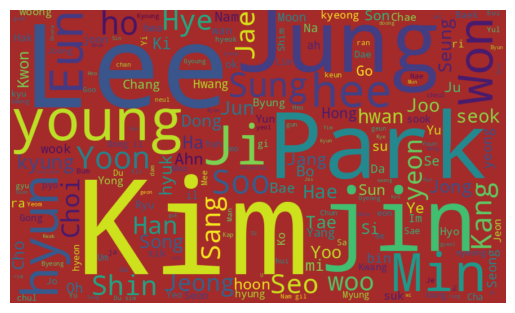

In [ ]:
for i in range(5):
  print(f'cluster {i}')
  kmeans_wordcloud(i,'cast', width=880, height=520)

***Representation of Country Variable for different clusters through WordCloud***

cluster 0


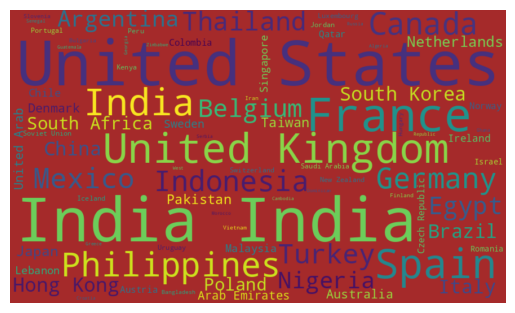

cluster 1


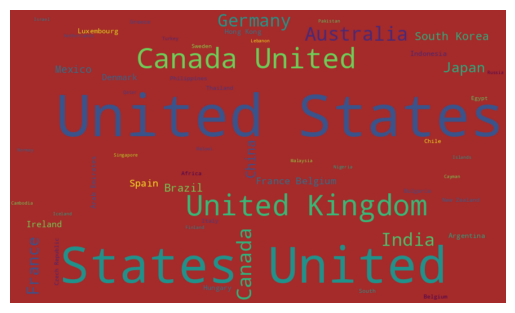

cluster 2


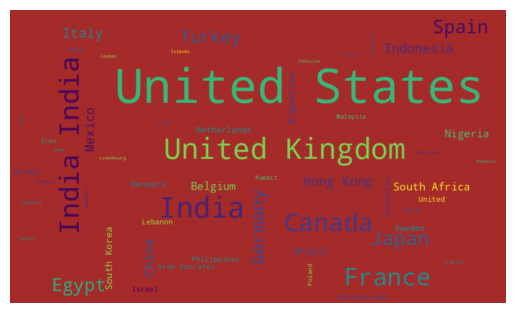

cluster 3


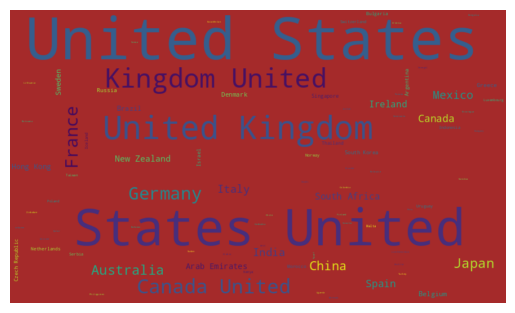

cluster 4


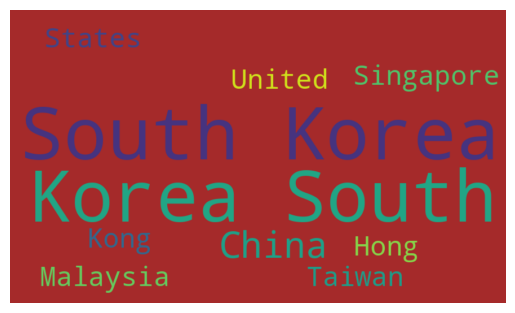

In [ ]:
for i in range(5):
  print(f'cluster {i}')
  kmeans_wordcloud(i,'country', width=880, height=520)

***Representation of Rating Variable for different clusters through WordCloud***

cluster 0


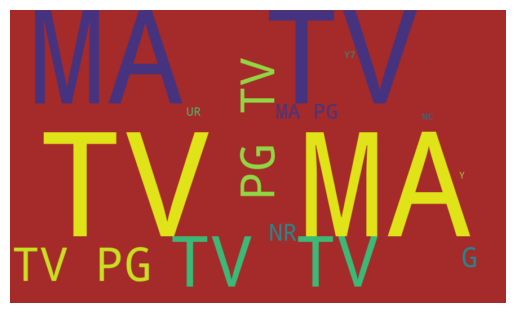

cluster 1


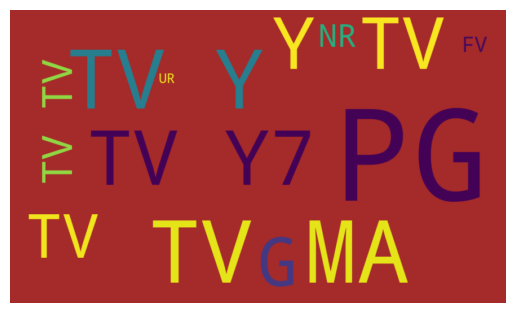

cluster 2


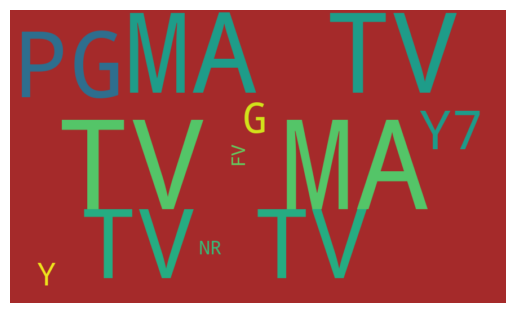

cluster 3


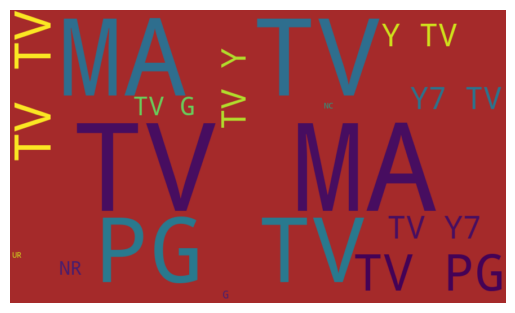

cluster 4


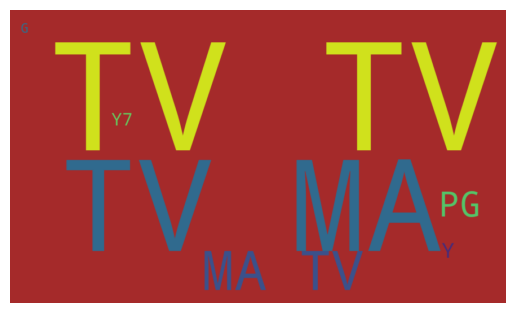

In [ ]:
for i in range(5):
  print(f'cluster {i}')
  kmeans_wordcloud(i,'rating', width=880, height=520)

***Representation of Listed in Genre Variable for different clusters through WordCloud***

cluster 0


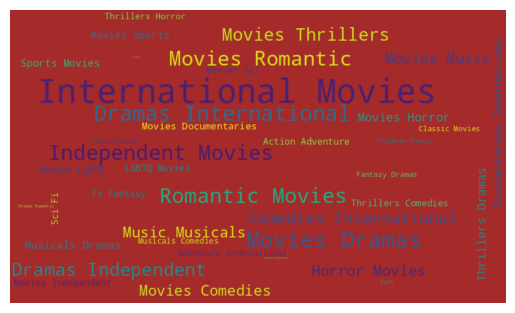

cluster 1


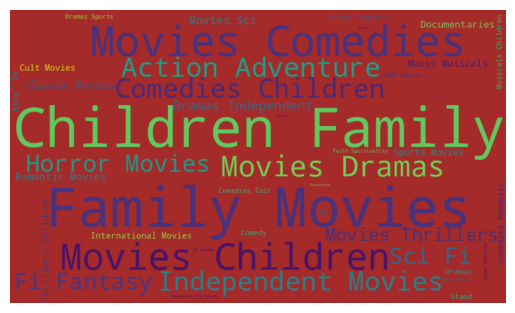

cluster 2


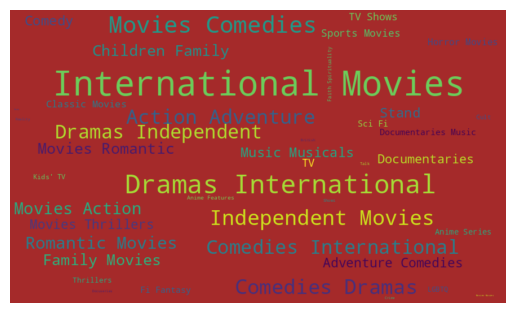

cluster 3


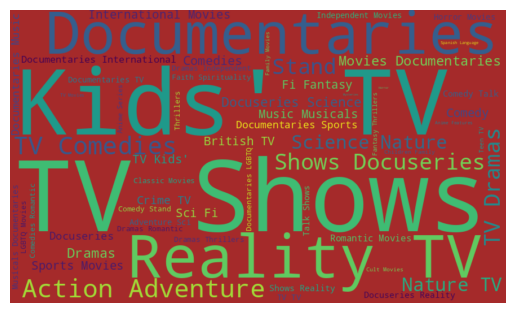

cluster 4


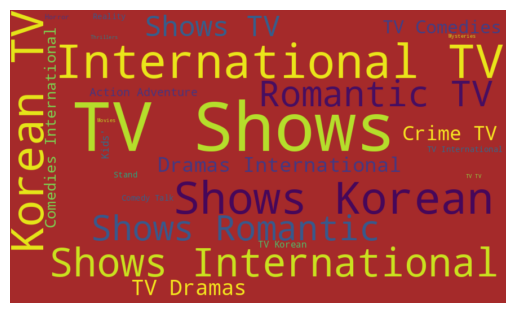

In [ ]:
for i in range(5):
  print(f'cluster {i}')
  kmeans_wordcloud(i,'listed_in', width=880, height=520)

***Representation of Description Variable for different clusters through WordCloud***

cluster 0


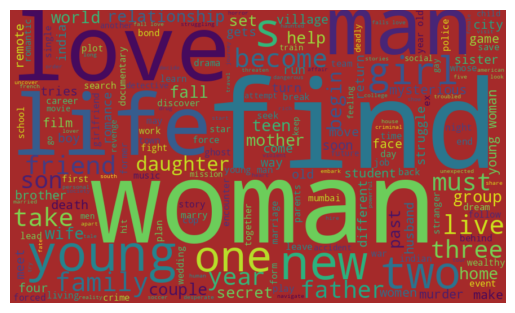

cluster 1


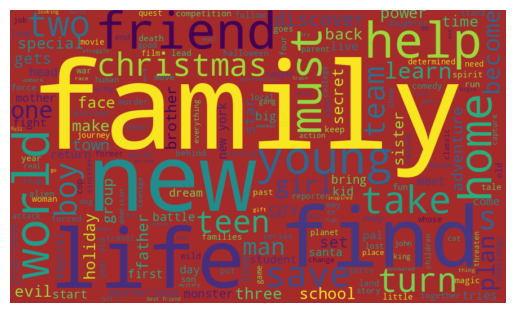

cluster 2


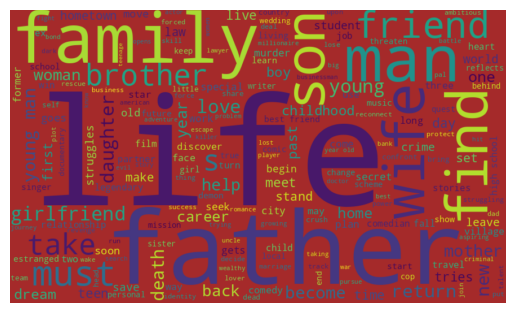

cluster 3


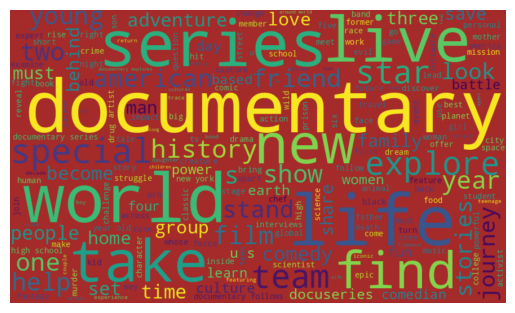

cluster 4


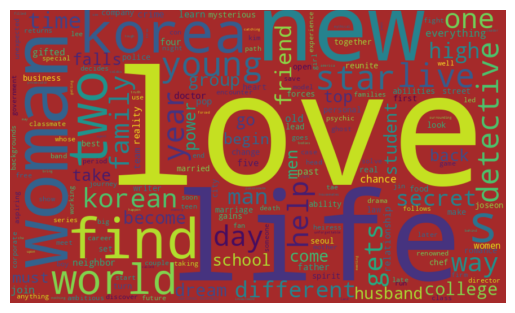

In [ ]:
for i in range(5):
  print(f'cluster {i}')
  kmeans_wordcloud(i,'description', width=880, height=520)


***Representation of Description Variable for different clusters through WordCloud***

cluster 0


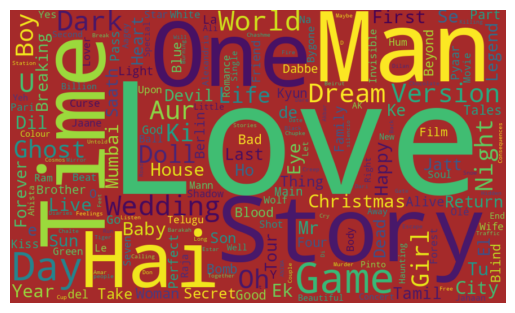

cluster 1


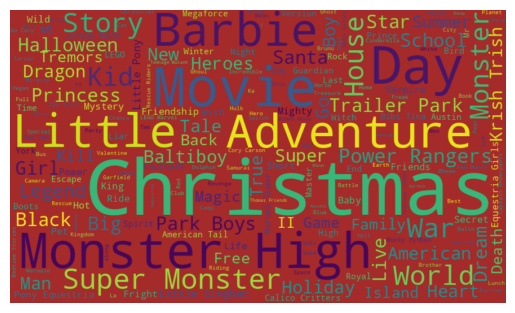

cluster 2


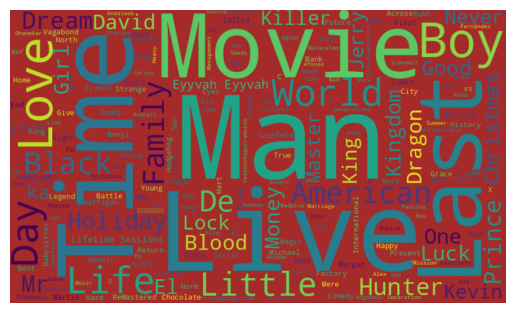

cluster 3


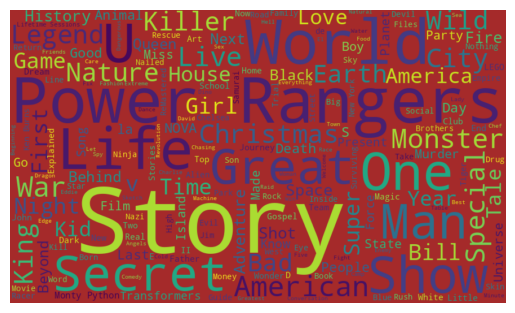

cluster 4


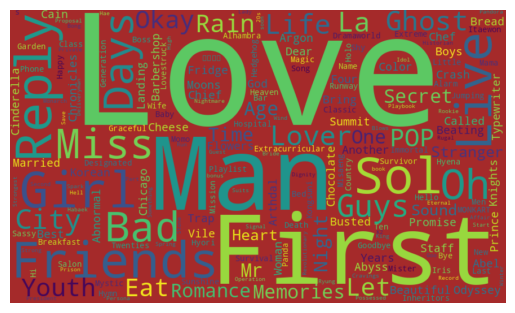

In [ ]:
for i in range(5):
  print(f'cluster {i}')
  kmeans_wordcloud(i,'title', width=880, height=520)

cluster 0


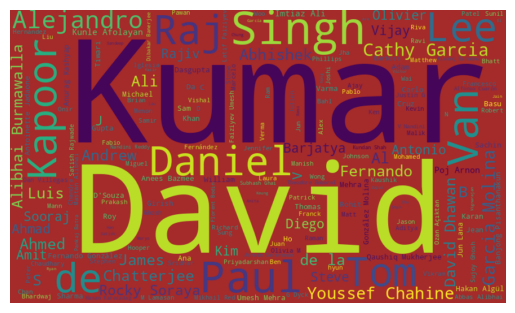

cluster 1


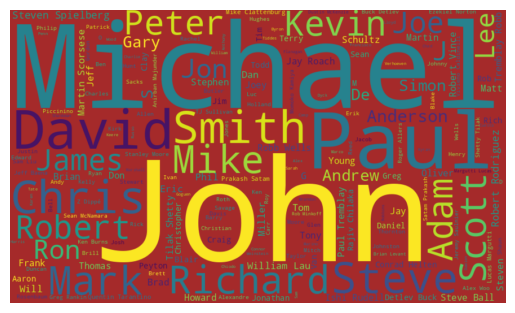

cluster 2


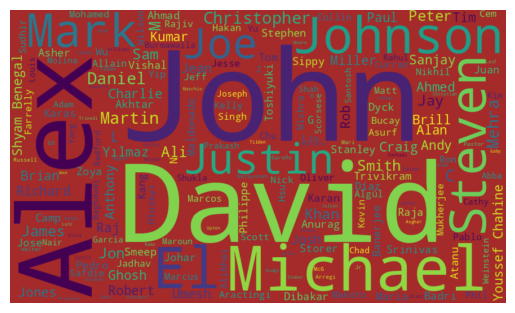

cluster 3


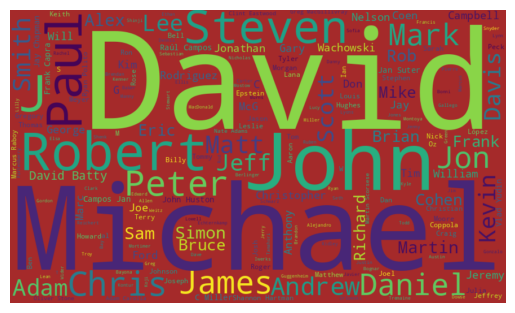

cluster 4


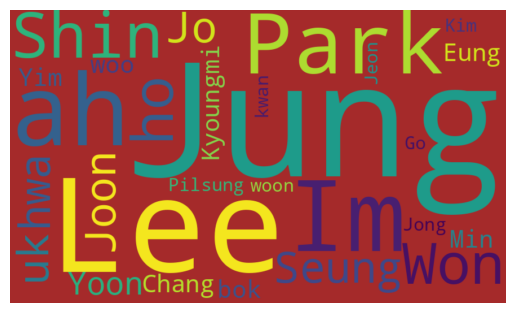

In [ ]:
for i in range(5):
  print(f'cluster {i}')
  kmeans_wordcloud(i,'director', width=880, height=520)

### 9. **Hierarchial Clustering**

*Agglomerative hierarchical clustering is a popular method for exploring the structure of a dataset by grouping similar objects into clusters. Here are some additional points to help understand how it works:*

* *The distance between samples can be calculated using different metrics such as Euclidean, Manhattan, or Cosine distance.*
* *The algorithm allows for different linkage criteria to determine the distance between clusters. Some commonly used linkage methods are single linkage, complete linkage, and average linkage.*
* The dendrogram is a useful visualization tool that helps to interpret the results of the clustering algorithm. It shows how the clusters are formed by merging smaller clusters at each step, and allows us to identify the optimal number of clusters based on the height of the dendrogram. *italicized text*
* *Agglomerative hierarchical clustering can be computationally expensive for large datasets, but it is a powerful method that can reveal interesting patterns and relationships in the data.*
* *One limitation of hierarchical clustering is that it assumes a tree-like structure, which may not be appropriate for all datasets. In some cases, other clustering methods such as k-means or DBSCAN may be more appropriate.*

Cluster labels:
[3 3 3 ... 3 3 3]


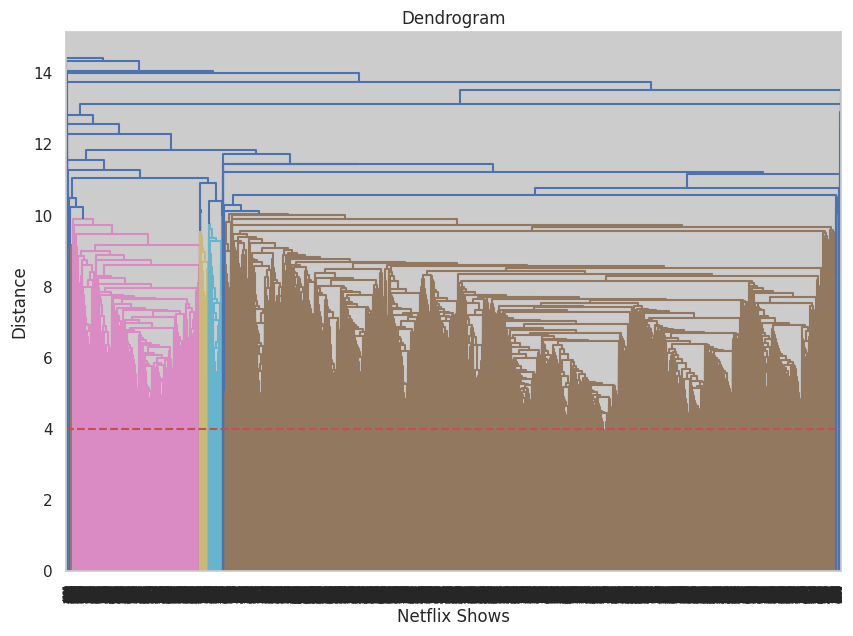

In [ ]:
# Building a dendogram to decide the number of clusters
plt.figure(figsize=(10, 7))  
linkage_matrix = shc.linkage(X, method='complete')
dend = shc.dendrogram(linkage_matrix)
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')

# Add a horizontal line to indicate the number of clusters
k = 4
plt.axhline(y= 4, color='r', linestyle='--')

# Assign cluster labels to the data points
cluster_labels = shc.fcluster(linkage_matrix, k, criterion='maxclust')

# Print the cluster labels
print("Cluster labels:")
print(cluster_labels)


In [ ]:
hierarchical = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='complete')
hierarchical.fit_predict(X)


array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
# Adding a hierarchical cluster number attribute
netflix_tv['hierarchical_cluster'] = hierarchical.labels_

In [ ]:
netflix_tv.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'hierarchical_cluster']]

,type,title,director,cast,country,rating,listed_in,description,hierarchical_cluster
1150,TV Show,Busted!,,"Yoo Jae-suk, Ahn Jae-wook, Kim Jong-min, Lee K...",South Korea,TV-14,"Crime TV Shows, International TV Shows, Korean...",tackling different mysteries episode game show...,0
4018,TV Show,Mega Food,,,United Kingdom,TV-G,"British TV Shows, Docuseries, International TV...","visiting busiest kitchens world, reality serie...",0
269,Movie,Aamir,Raj Kumar Gupta,"Rajeev Khandelwal, Gajraj Rao, Shashanka Ghosh...",India,TV-14,"International Movies, Thrillers","high-tension thriller, anonymous caller cell p...",0
6862,TV Show,The Shannara Chronicles,,"Austin Butler, Poppy Drayton, Ivana Baquero, M...","United States, New Zealand",TV-MA,"TV Action & Adventure, TV Dramas, TV Sci-Fi & ...","destruction civilization, three young heroes b...",0
2893,Movie,I Am Maris,Laura VanZee Taylor,Maris Degener,United States,TV-14,Documentaries,"words art, young woman details healing power y...",0


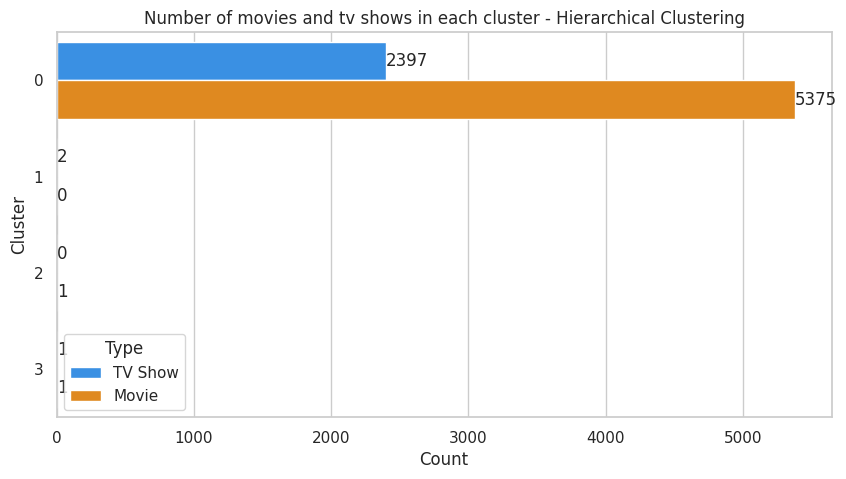

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
graph = sns.countplot(y='hierarchical_cluster',data=netflix_tv, hue='type',
                      palette={'Movie': 'darkorange', 'TV Show': 'dodgerblue'})
plt.title('Number of movies and tv shows in each cluster - Hierarchical Clustering')

# adding value count on the right of bar
for p in graph.patches:
   graph.annotate(format(p.get_width(), '.0f'), (p.get_width(), p.get_y() + p.get_height()/2),
                  ha = 'left', va = 'center')

plt.xlabel('Count')
plt.ylabel('Cluster')
plt.legend(title='Type')
plt.show()


In [ ]:
def hierarchical_worldcloud(cluster_number, column_name):
  
  '''function for Building a wordcloud for the movie/shows'''

  df_wordcloud = netflix_tv[['hierarchical_cluster',column_name]].dropna()
  df_wordcloud = df_wordcloud[df_wordcloud['hierarchical_cluster']==cluster_number]
  
  # text documents
  text = " ".join(word for word in df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="skyblue").generate(text)
  
  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

***Representation of Description Variable for different clusters through WordCloud***

cluster 0


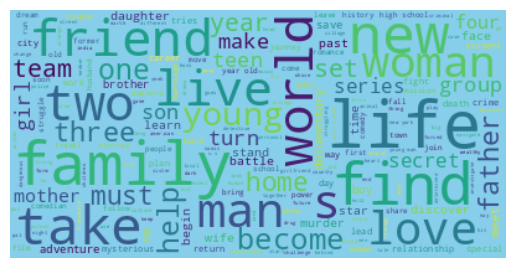

cluster 1


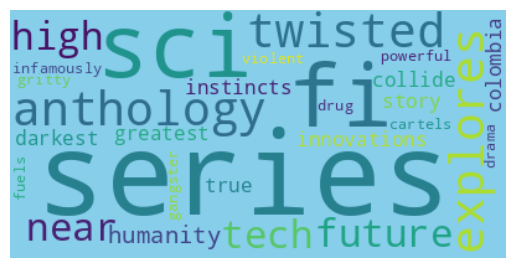

cluster 2


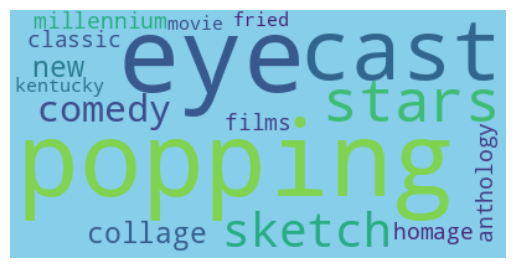

cluster 3


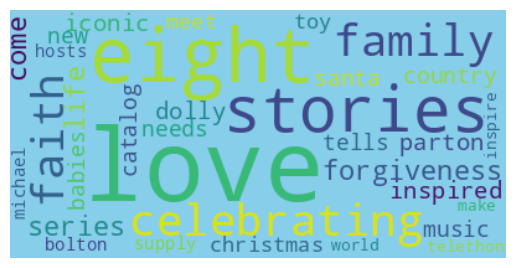

In [ ]:
for i in range(4):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'description')

***Representation of Cast Variable for different clusters through WordCloud***

cluster 0


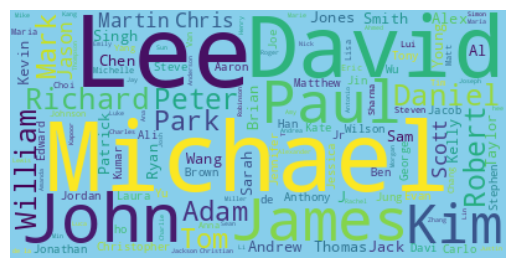

cluster 1


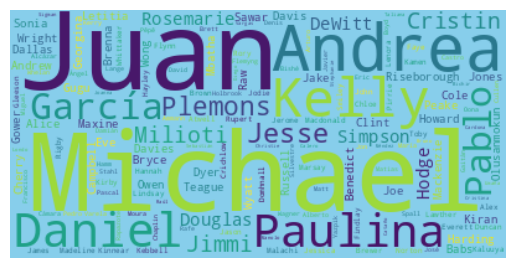

cluster 2


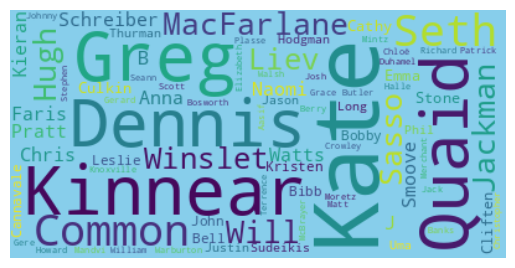

cluster 3


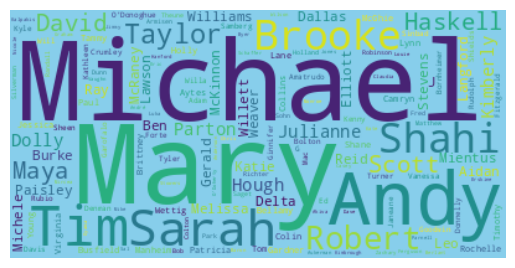

In [ ]:
for i in range(4):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'cast')

***Representation of Country Variable for different clusters through WordCloud***

cluster 0


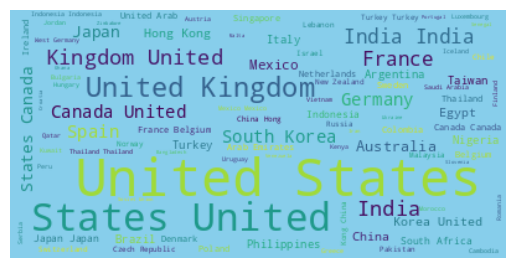

cluster 1


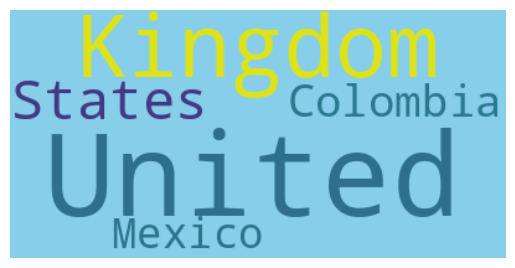

cluster 2


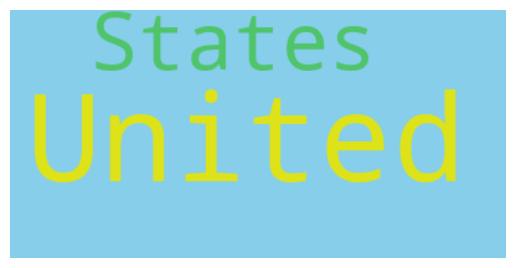

cluster 3


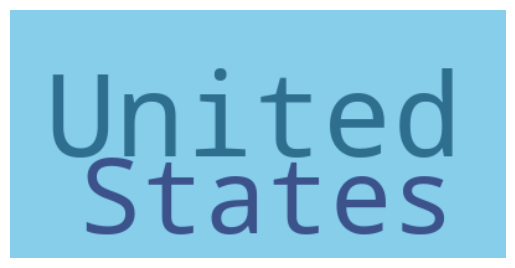

In [ ]:
for i in range(4):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'country')

***Representation of Listed_in Variable for different clusters through WordCloud***

cluster 0


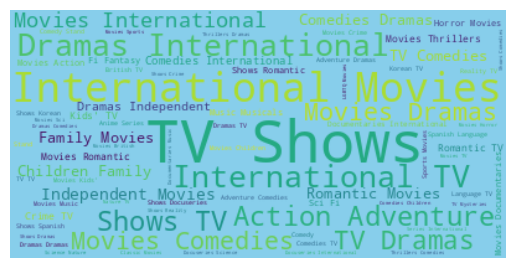

cluster 1


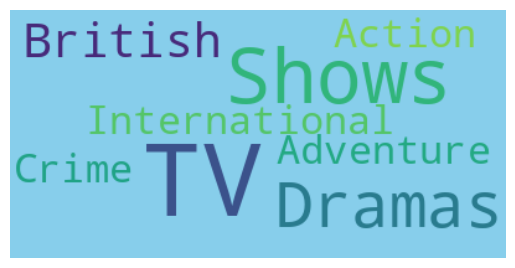

cluster 2


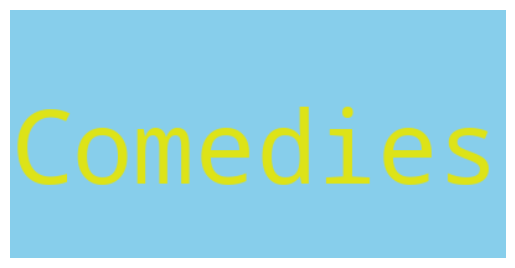

cluster 3


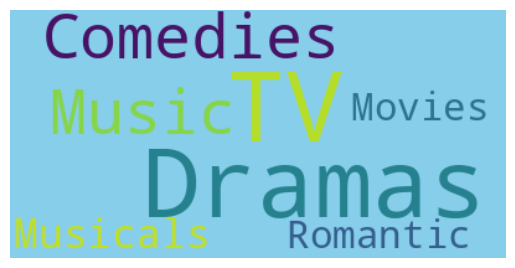

In [ ]:
for i in range(4):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'listed_in')

## **10. Content Based Recommendation System**
*A content-based recommendation system suggests items to users by finding similarities between those items based on their descriptions or features. It considers the user's preferences and the preferences of users with similar behavior to recommend items that the user may like.*

*A basic content-based recommender system can be developed by assessing the similarity of TV shows or movies. When a user views a program on Netflix, the system should be capable of presenting a list of comparable shows that the user might enjoy. To compute the similarity score, cosine similarity can be utilized. To determine the similarity between two vectors, the dot product of the two vectors is divided by the magnitude value. Essentially, the cosine similarity rating of two vectors increases as the angle between them decreases.*

In [ ]:
netflix_tv[['show_id', 'title', 'release_year', 'country', 'tags']]


,show_id,title,release_year,country,tags
0,s1,3%,2020,Brazil,in a futur where the elit inhabit an island pa...
1,s2,7:19,2016,Mexico,after a devast earthquak hit mexico citi trap ...
2,s3,23:59,2011,Singapore,when an armi recruit is found dead hi fellow s...
3,s4,9,2009,United States,in a postapocalypt world ragdol robot hide in ...
4,s5,21,2008,United States,a brilliant group of student becom cardcount e...
...,...,...,...,...,...
7782,s7783,Zozo,2005,"Sweden, Czech Republic, United Kingdom, Denmar...",when lebanon civil war depriv zozo of hi famil...
7783,s7784,Zubaan,2015,India,a scrappi but poor boy worm hi way into a tyco...
7784,s7785,Zulu Man in Japan,2019,,in thi documentari south african rapper nasti ...
7785,s7786,Zumbo's Just Desserts,2019,Australia,dessert wizard adriano zumbo look for the next...


* *The dataframe above contains 7777 rows of data. The last index number shown is 7787 because some rows were dropped due to null values.*

* *To build a content-based recommendation system, we calculate the similarity score for a specific index_id with respect to the "tags" column.*

* *If we don't reset the index, there is a high chance that we will calculate cosine similarity for the wrong index instead of the one we intended. To avoid this problem and ensure that we properly address the index when building the recommendation system, we can simply reset the index.*

In [ ]:
# defining new dataframe for building recommandation system
recommender_df = netflix_tv.copy()

# reseting index
recommender_df.reset_index(inplace=True)

# checking whether or not reset index properly 
recommender_df[['show_id', 'title', 'release_year', 'country', 'tags']]

,show_id,title,release_year,country,tags
0,s1,3%,2020,Brazil,in a futur where the elit inhabit an island pa...
1,s2,7:19,2016,Mexico,after a devast earthquak hit mexico citi trap ...
2,s3,23:59,2011,Singapore,when an armi recruit is found dead hi fellow s...
3,s4,9,2009,United States,in a postapocalypt world ragdol robot hide in ...
4,s5,21,2008,United States,a brilliant group of student becom cardcount e...
...,...,...,...,...,...
7772,s7783,Zozo,2005,"Sweden, Czech Republic, United Kingdom, Denmar...",when lebanon civil war depriv zozo of hi famil...
7773,s7784,Zubaan,2015,India,a scrappi but poor boy worm hi way into a tyco...
7774,s7785,Zulu Man in Japan,2019,,in thi documentari south african rapper nasti ...
7775,s7786,Zumbo's Just Desserts,2019,Australia,dessert wizard adriano zumbo look for the next...


*As shown in the dataframe above, we were able to reset the index of the dataset. This indicates that the dataset is now properly formatted and ready to be used for building a content-based recommendation system.*

In [ ]:
# dropping show-id and index column
recommender_df.drop(columns=['index', 'show_id'], inplace=True)

In [ ]:
print(f"before reset index id for movie 'Avengers: Infinity War' : {netflix_tv[netflix_tv['title'] == 'Avengers: Infinity War'].index[0]}")  # index[0] --> to locate index position
print(f"after reset index id for movie 'Avengers: Infinity War': {recommender_df[recommender_df['title'] == 'Avengers: Infinity War'].index[0]}")

before reset index id for movie 'Avengers: Infinity War' : 635
after reset index id for movie 'Avengers: Infinity War': 633


In [ ]:
# calling out transformed array independent features created from tags(cluster) column after performing PCA for dimenssionality reduction.
X

array([[ 2.47092782, -0.09298839,  0.00983472, ..., -0.10383531,
         0.05833221, -0.05406886],
       [-0.49814513, -0.31079765,  0.43943348, ..., -0.02082722,
        -0.05165953,  0.01358825],
       [-0.70880374,  0.68559226,  0.63123186, ..., -0.0108008 ,
         0.01229382,  0.02387418],
       ...,
       [-0.69699209, -0.44116702,  0.76474555, ...,  0.00896366,
         0.00468805,  0.00497228],
       [ 0.5442647 , -0.49278917, -0.28550854, ..., -0.03424303,
        -0.01817863,  0.04644784],
       [-0.513918  , -0.85086471, -0.73664387, ...,  0.02004299,
         0.00811322, -0.05718266]])

***Cosine Similarity***
*Cosine similarity is a measure of similarity between two non-zero vectors of an inner product space. It calculates the cosine of the angle between the two vectors, which ranges from -1 (opposite directions) to 1 (same direction), with 0 indicating orthogonality.*



In [ ]:
# calculating cosine similarity
cosine_sim= cosine_similarity(X)
cosine_sim

array([[ 1.        ,  0.022574  , -0.03814225, ..., -0.10354794,
         0.09088256, -0.07426229],
       [ 0.022574  ,  1.        ,  0.00272099, ...,  0.14369301,
        -0.02905673, -0.01387281],
       [-0.03814225,  0.00272099,  1.        , ...,  0.03894032,
        -0.06494857, -0.04090233],
       ...,
       [-0.10354794,  0.14369301,  0.03894032, ...,  1.        ,
         0.02378329,  0.15555195],
       [ 0.09088256, -0.02905673, -0.06494857, ...,  0.02378329,
         1.        ,  0.12316769],
       [-0.07426229, -0.01387281, -0.04090233, ...,  0.15555195,
         0.12316769,  1.        ]])

In [ ]:
#defining a recommend function 
def recommend(movie,cosine_sim= cosine_similarity(X)):
    '''
    This function list down top ten movies on the basis of similarity score for that perticular movie.
    '''
    print(f"If you liked '{movie}', you may also enjoy: \n")

    # finding out index position
    index = recommender_df[recommender_df['title'] == movie].index[0]
    sim_score = list(enumerate(cosine_sim[index]))
    sim_score = sorted(sim_score, key= lambda x: x[1], reverse=True)[1:11] #position 0 is the movie itself, thus exclude
    recommend_index = [i[0] for i in sim_score]
    rec_movie = netflix_tv['title'].iloc[recommend_index]
    rec_score = [round(i[1],4) for i in sim_score]
    rec_table = pd.DataFrame(list(zip(rec_movie,rec_score)), columns=['Recommend programme','Similarity(0-1)'])
    return rec_table
    

In [ ]:
recommend('Citation')

If you liked 'Citation', you may also enjoy: 



,Recommend programme,Similarity(0-1)
0,Phone Swap,0.2961
1,Oct-01,0.2551
2,The Bridge,0.2217
3,Potato Potahto,0.2199
4,The Figurine (Araromire),0.2072
5,Diamonds in the Sky,0.1980
6,Mokalik (Mechanic),0.1946
7,The Royal Hibiscus Hotel,0.1943
8,Kucch To Hai,0.1909
9,The CEO,0.1854


In [ ]:
recommend('Avengers: Infinity War')

If you liked 'Avengers: Infinity War', you may also enjoy: 



,Recommend programme,Similarity(0-1)
0,Thor: Ragnarok,0.2285
1,LEGO Friends: The Power of Friendship,0.2145
2,Once in a Lifetime Sessions with Kasabian,0.1678
3,The Little Prince,0.1666
4,The Pursuit of Happyness,0.1634
5,Her,0.1584
6,The Little Mermaid,0.1511
7,Takers,0.1446
8,The Croods,0.1439
9,Race to Witch Mountain,0.1424


In [ ]:
recommend('The Lies Within')

If you liked 'The Lies Within', you may also enjoy: 



,Recommend programme,Similarity(0-1)
0,Voice,0.6322
1,Memories of the Alhambra,0.6188
2,One Spring Night,0.6182
3,Signal,0.6123
4,"Hi Bye, Mama!",0.6056
5,Another Miss Oh,0.5901
6,The Lady in Dignity,0.5876
7,The King: Eternal Monarch,0.5861
8,Designated Survivor: 60 Days,0.5719
9,Boys Over Flowers,0.5659


In [ ]:
recommend('Breaking Bad')

If you liked 'Breaking Bad', you may also enjoy: 



,Recommend programme,Similarity(0-1)
0,The Underclass,0.4005
1,Better Call Saul,0.3853
2,Hormones,0.3817
3,The School Nurse Files,0.3583
4,Re:Mind,0.3495
5,Girl from Nowhere,0.3432
6,Project S The Series,0.3346
7,Jinn,0.3291
8,Kakegurui,0.3211
9,Bitten,0.3205


# **Conclusion**

### ***EDA***

* *The majority of content is uploaded to Netflix during the months of October, November, December, and January, potentially due to winter weather and increased viewing.*
* *Movies make up 69.14% of the content on Netflix, while TV shows make up 30.86%.*
* *The number of movies added to Netflix is increasing at a faster rate than TV shows.*
* *Netflix tends to upload content at the start, middle, or end of a month, with the 1st, 15th, and 31st days being significant.*
* *Most content on the platform is produced by the USA, India, and UK.*
* *TV-MA is the most common TV show rating on Netflix, followed by TV-14 and TV-PG.*
* *Dramas are the most common genre on Netflix, followed by comedies and action/adventure.*
* *The presence of words like Christmas, Love, World, Man, and Story in titles may indicate seasonal and thematic trends in content.*
* *Raúl Campos, Jan Suter, Marcus Raboy, Jay Karas, and Cathy Garcia-Molina are among the* top 5 directors with the highest count of movies and TV shows on the platform.
*  *A majority of movies on Netflix have a runtime between 90 and 120 minutes.*
* *TV shows on Netflix typically have one or two seasons.*
* *Entertainment preferences and target ages vary significantly across different nations, indicating cultural differences in content preferences.*

### ***Clustering***

* *The data was clustered based on six different attributes, namely, director, cast, country, genre, rating, and description. The values in these attributes were first tokenized and preprocessed, and then vectorized using Count vectorizer, which resulted in the creation of 10,000 attributes.*

* *To handle the issue of high dimensionality, Principal Component Analysis (PCA) was used, which was able to capture over 85% of the variance with only 2300 components. Therefore, the number of components was restricted to 2300 to reduce the computational complexity.*

* *The K-Means clustering algorithm was initially used to build the clusters, and through the elbow method and silhouette score analysis, it was determined that the optimal number of clusters was Seven.*

* *Afterwards, the Agglomerative clustering algorithm was applied to the data, and the optimal number of clusters was found to be four after visualizing the dendrogram. This allowed for a more detailed clustering of the data and improved the accuracy of the recommendation system.*

* *Using the similarity matrix obtained from the cosine similarity calculation, a content-based recommendation system was built. This system analyzes the user's watched shows to identify similar shows in the dataset and provides 10 recommendations to the user based on their viewing history with their respective Similarity scores.*

* *Overall, this clustering and recommendation system is designed to improve the user's streaming experience by suggesting relevant content based on their interests and viewing history.*